# Installation and Import of Python Libraries
<a name="1"></a>

1. We Utilize Standardlone Python Packages 
2. Installation of Anaconda Package is the Preferred  and can be downloaded from $\color{Blue}{\text{https://www.anaconda.com/products/distribution}}$
3. Different Python libraries can be installed by conda itself. \
     $\color{Blue}{\text{conda install numpy}}$ \
     $\color{Blue}{\text{conda install -c conda-forge jupyterlab pyopencl matplotlib fabio pyfai lmfit}}$ \
     $\color{Blue}{\text{conda install -c anaconda pandas pathlib scipy}}$ \
     $\color{Blue}{\text{conda install -c plotly plotly}}$ \
     $\color{Blue}{\text{conda install -c conda-forge peakutils}}$ \
     $\color{Blue}{\text{conda install -c conda-forge glob2}}$ \
    
  
     
     
     
   
3. Let's first load the packages that we will need for the analysis. 


In [1]:
from __future__ import print_function
%matplotlib notebook
# The function of the previous line is to allow dynamic view of the plots (with zoom-in, zoom-out etc.)

# Some base functionalities of python can be loaded through these two packages
import os 
import re

# Pathlib enable to generate path valid for both Windows and Unix systems
#    https://docs.python.org/3/library/pathlib.html
from pathlib import Path

# Numpy is a package containing several mathematic useful function, the value of pi, etc. as we will use it several time we will call it "np" for short
import numpy as np

# Load various scientific-related function (such as linear regression ...)
from scipy import stats

# Fabio is a package allowing us to read and write .edf images
import fabio

# Pandas can manage tables and databases, we will use it only to load tables stored as .txt or .csv
import pandas as pd

# lmfit is a fitting function package, we will use it to fit Pseudo-Voigt profile to our experimental data
import lmfit
from lmfit import Parameters, fit_report, minimize

# Matplotlib is a well-known plotting package
from matplotlib import pyplot as plt
from matplotlib import cm

# pyFAI is the package we will use for the calibration of the detector geometry and the data reduction (azimuthal integration)
import pyFAI

import plotly.graph_objs as go
import plotly.tools as tools
import plotly.figure_factory as ff

import numpy as np
import pandas as pd
import scipy
import peakutils
import sklearn
from sklearn import datasets
from sklearn.linear_model import LinearRegression
import glob
import numpy as np
from scipy import stats
import statsmodels.api as sm
import matplotlib.pyplot as plt
from statsmodels.sandbox.regression.predstd import wls_prediction_std
from statsmodels.iolib.table import (SimpleTable, default_txt_fmt)
np.random.seed(1024)
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.pyplot import rcParams


# Custom functions /Converting X-ray Energy to Wavelength
<a name="2"></a>

It can be handy to create a few functions that you can use in the rest of your code, in our case we will define a simple function to convert the energy into wavelength.


In [2]:
def get_wavelenght(E):
    # Energy should be in keV !!!
    # Return the wavelenght in m
    # -----------------------------------
    # Plank Constant
    h = 6.62607004e-34 # m2 . kg / s
    # light celerity
    c = 299792458 # m / s
    # Joule -> eV
    eV = 6.242e+18 # eV / J
    
    # Conversion Energy -> wavelenght 
    wavelenght = ((h*c)/(E*1e3 / eV))  # m
    
    return wavelenght

## Define Location/Path of the Raw XRD-files and location where results are stored

<a name="3"></a>
>  1. Create folder manually with appropriate names and locations \
>  2. Helpful in Sorting data later 





In [9]:
# This is the base repository (In this case "Exercise_CeXS_Workshop"), 
# if you want to move the "Script" directory to another location,
# along with all your other scripts for instance, this can become useful.
path_base = Path("C://Users//NayakS//Desktop//Marcus//DESY-2022-BoridesSL//raw//PS22017//")

# Path to the directory containing the images from the detecor (in .edf format)
path_raw = Path(path_base, "raw_images")

# Path to the directory containing utilities for the data analysis (such as the experiment notebook, detector information, etc.)
path_ut = Path(path_base, "utilities", "correction")

# Path to the future integrated 1D curves, that we will compute from the images in "path_raw" 
path_int = Path(path_base, "integrated")

# Path to the analysis results (graphs, dataset of stress-strain ...)
path_res = Path(path_base, "results")

## Estimation of Distance Between  the Samples and Detector

<a name="3"></a>
> Also Determines the position of direct beam
> Note: Needed only once for LaB6 or any other samples that is used (Preferably NIST standard samples)
### Our Experimental Geometry at DESY-P07/Transmission Mode
<img src="Illustrations/Test.png" alt="Drawing" style="width: 500px;"/>


<br>

<img src="Illustrations/PONI1.png" width=500>

<br>
<br>




<br>

<img src="Illustrations/PONI2.png" width=300>

<br>
<br>
<br>

> In most of our experiments, in one beamtime, the distance between sample position and detector is fixed.

## Here is a step by step for calibration
> A. Here we used a x-ray energy of 73.79 keV \
> B. 2D area detector  from PerkinElmer is used\
> C. NIST standard LaB$_6$ powder sample is used



<br>

<br>

<br>


<img src="Illustrations/step1.png" alt="Drawing" style="width: 600px;"/>
<img src="Illustrations/step2.png" alt="Drawing" style="width: 600px;"/>
<img src="Illustrations/step3.png" alt="Drawing" style="width: 600px;"/>
<img src="Illustrations/step4.png" alt="Drawing" style="width: 600px;"/>

In [4]:
## This command launch the pyFAI GUI for calibration, you could either run it directly to your anaconda prompt/Unix terminal as pyFAI-calib2
#os.system("pyFAI-calib2")

> NB: In order to directly load all the information needed by pyFAI, we could have done:
> 
>```python
> E = 73.79045 # keV
> detector = 'perkindetector' 
> calib_type = 'LaB6'
> path_img_calib = Path(path_raw, "LaB6-00004.tiff")
> #path_img_mask = Path(path_ut, "detector_mask.edf")  ## Not required
> 
> cmd = f"pyFAI-calib2 -e {E} --calibrant {calib_type} -D {detector}  {path_img_calib}"
> os.system(cmd)
>```


In [5]:
# E = 73.79045 # keV
# detector = 'perkindetector' 
# calib_type = 'LaB6'
# path_img_calib = Path(path_raw, "LaB6-00004.tif")
# #path_img_mask = Path(path_ut, "detector_mask.edf")  ## Not required
# cmd = f"pyFAI-calib2 -e {E} --calibrant {calib_type} -D {detector}  {path_img_calib}"
# os.system(cmd)


# Define the mask for the integration
<a name="5"></a>

> We can mask some region of the XRD data if any shadow effect is present in the diffractogram. \
> We use masking for our experimental samples. Not required for Calibrants. \
> For that we use pyFAI GUI again:  

In [13]:
# We will directly fill the information from the experiment (see above NB)
E = 73.800 # keV
detector = 'perkindetector'
calib_type = 'LaB6'
#path_img_mask = Path(path_ut, "detector_mask.edf")

os.system(f"pyFAI-calib2 -e {E} --calibrant {calib_type} -D {detector}") 
          #-m {path_img_mask}")

0

Then, open one acquisition image (any of them) and click next to go to the mask creation section.

In order to see if you have some shadowing effect, you can tune the image colormap, try to:
- switch from linear to log scale (Normalization:)
- play with min and max value of the colorscale
- change the colormap (Colormap:)



<br>

<img src="Illustrations/mask1.png" width=700>

<br>
<br>

<img src="Illustrations/mask2.png" width=600>

<br>
<br>
<br>

> 

# Data reduction
<a name="6"></a>

Now it is time to perform the azimuthal integration. We will start by the integration of one .edf image of the detector using pyFAI.

First of all, we need to load the experimental geometry that we define earlier (.poni file), as well as the mask image (.edf):

In [10]:
poni_fileName = "PONI.poni"
#mask_fileName = "mask.edf"

path_geometry = Path("detector_mask/" , poni_fileName)
#path_mask = Path("detector_mask/" , mask_fileName)

# Let's load the .poni first (ai stand for azimuthal integration)
ai = pyFAI.load(str(path_geometry))

print(f"Geometry loaded ({path_geometry})")
print('----------')
print(ai)
print('----------')

# Then load the mask using the fabio package
#mask = fabio.open(path_mask) 
# At this stage "mask" is an object with many information, but we care only about the data of the image...
#mask = mask.data
#print(f"Using  {path_mask}  as mask file")

Geometry loaded (detector_mask\PONI.poni)
----------
Detector Perkin detector	 PixelSize= 2.000e-04, 2.000e-04 m
Wavelength= 1.680003e-11 m
SampleDetDist= 2.471120e+00 m	PONI= 2.102380e-01, 2.055683e-01 m	rot1=0.000945  rot2=-0.003602  rot3=-0.000022 rad
DirectBeamDist= 2471.138 mm	Center: x=1016.165, y=1006.691 pix	Tilt= 0.213° tiltPlanRotation= -104.703° 𝛌= 0.168Å
----------


> You can notice that the .poni file contain the detector geometry but also the wavelength and all the information available about the detector

Now we need to define the parameters for the azimuthal integration, namely:
- $N_{pts}$ : the number of integration points (number of points on the 1D curve)
- $\delta_{rng}$ : the azimuthal angle range to include in the integration
- $r_{rng}$ : the radial range to include in the integration
- The unit in which we want the x-axis of the 1D curve, as well as the $\delta_{rng}$ and $r_{rng}$ ($2\theta$ in degree/radian, scattering vector in $nm^{-1}$ ...)

<br>
<br>

<img src="Illustrations/Scheme_ai_crop.png" width=500>

<br>

The details of the `.integrate1d()` function of pyFAI can be find here: https://pyfai.readthedocs.io/en/master/api/pyFAI.html#module-pyFAI.azimuthalIntegrator

-----------

<br>

For a first shot, we will not set the radial or azimuthal ranges. This way pyFAI will integrate over the whole detector which will allow us to setup the ranges easily looking at the integrated curve.

--

For the number of integration points, we will sart with 2 000 points arbitrarily (we will refine it later).

--

We also need to load the image to integrate with python (in the same way than the mask image, with fabio).

## Azimuthal Integration, strain/stress determination
> Recommended to do first for one Diffractogram \
> Batch Analysis at Later stages

In [8]:
#import backgroundimage and substratct
# path_IMG_bkg = Path("M://RunX23-dark//RunX23-dark-00010.tif")
# IMG_bkg_1 = fabio.open(path_IMG_bkg)
# IMG_bkg = IMG_bkg_1.data

In [16]:
#IMG_bkg

In [11]:
# Number of integration points
# ---------
N_pts = 2000
    
# Loading the image file of the sample (open the 148th image with a maximum load applied on the sample)
# ---------
fileName = "ps22017-00031"

#path_IMG = Path("C://Users//NayakS//Desktop//Marcus//DESY-2022-BoridesSL//raw//PS22014second//", fileName + ".tif")
path_IMG = Path(path_base, fileName + ".tif")
IMG = fabio.open(path_IMG)
IMG = IMG.data
#IMG = IMG.data-IMG_bkg

#  Azimuthal integration
# --------
save_path = Path(path_int, fileName + ".dat") # It should be .dat files (text files)

print(f"Integrating {path_IMG} ...")
res = ai.integrate1d(IMG,
                     npt = N_pts,
                     unit = "2th_deg", # We want to use 2 theta in degree 
                   #  mask = mask, # (1 for masked pixels, and 0 for valid pixels is the pyFAI standard)
                     filename = save_path)
print(f"saved at  {save_path}")

Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\ps22017-00031.tif ...


saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031.dat


### Visualization of the Azimuthal integrted data

<IPython.core.display.Javascript object>


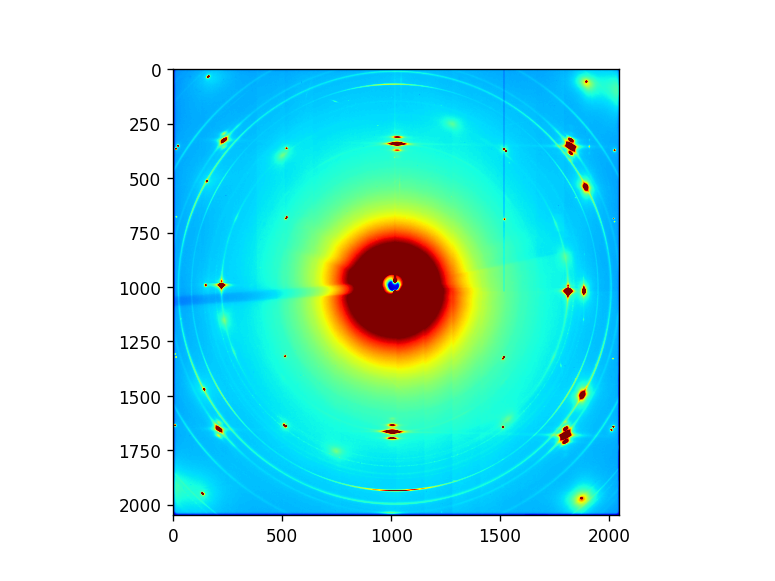

In [12]:
#Original XRD pattern
fig = plt.figure()
plt.imshow(IMG, cmap='jet')
plt.clim(0,100000)
plt.show()

<IPython.core.display.Javascript object>


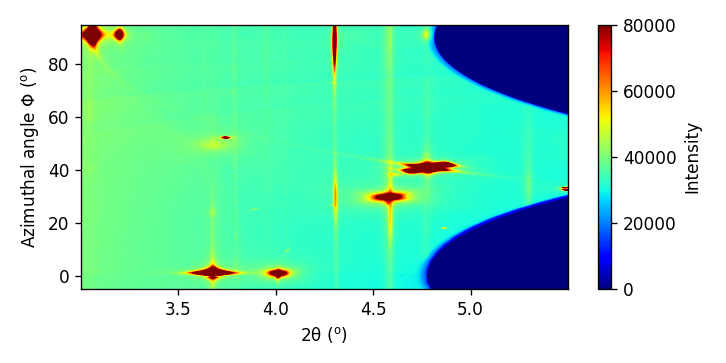

In [13]:
##Polar transformed 2d-XRD

res2d = ai.integrate2d(IMG,   500, 500, unit="2th_deg",azimuth_range = [-5,95],
                         radial_range = [3,5.5])
rcParams["image.cmap"] =  'jet'
fig, ax = plt.subplots(1,1, figsize=(6,3))

I, tth, chi = res2d
im=ax.imshow(I, origin="lower", extent=[tth.min(), tth.max(), chi.min(), chi.max()], 
             aspect="auto",vmin=0, vmax=80000)
#ax.set_yticks([0,15,30,45,60,75,90])
#ax.set_yticklabels([0,15,30,45,60,75,90])
#ax.set_xticks([3.4,3.6,3.8,4.0,4.2,4.4,4.6,4.8,5.0])
ax.set_xlabel(r"$2\mathrm{\theta \ (^o)} $ ")
ax.set_ylabel("Azimuthal angle $\mathrm{\Phi \ (^o)} $ ")


cbar=fig.colorbar(im)
cbar.set_label('Intensity')

fig.tight_layout()

In [14]:
I.shape

(500, 500)

`res` contain several information, in particular, the values of intensity are saved in `res.intensity` and the $2\theta$ values are saved in `res.radial`. To make it more simple, we will save those in separate variables, and plot the diffractogram.

<IPython.core.display.Javascript object>


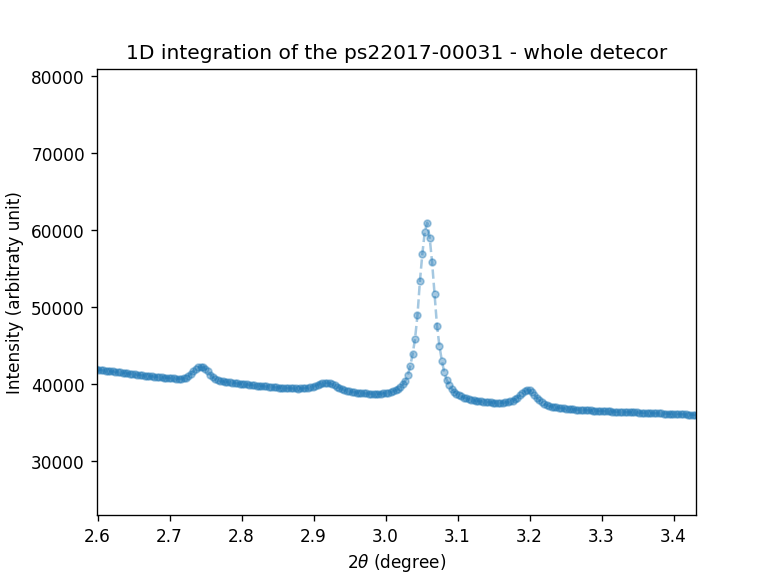

In [15]:
Tth = res.radial # deg
d_hkl=get_wavelenght(73.8)/(2*np.sin((Tth*np.pi/180)/2))
I = res.intensity


fig = plt.figure()
plt.plot(Tth, I, marker="o", linestyle="--", alpha=0.4, markersize=4)
#plt.plot(d_hkl, I, marker="o", linestyle="-", alpha=0.4, markersize=4)
plt.yscale("linear")
plt.xlabel(r"$2\theta$ (degree)")
plt.ylabel("Intensity (arbitraty unit)")
plt.title(f"1D integration of the {fileName} - whole detecor")
#plt.xlim(1,3)
fig.show()

## Visualization of Process Behind the Process
<img src="Illustrations/prog2.png" width=1000>

> NB: By default, `.integrate1d()` correct the intensity from the solid angle for each pixel of the detector.

The $\mathrm{TiN}$ or $\mathrm{Ti_{0.50}Al_{0.50}N}$ (FCC - Fm-3m) structure should have 3 peaks visible at this energy:
- [1 1 1]: $\approx$ 3.9°
- [2 0 0]: $\approx$ 4.5°
- [2 2 0]: $\approx$ 6.5°

> The powder patterns can be calculated from .cif crystallographic files (from COD for instance http://www.crystallography.net/cod/) by free software like: 
>- Mercury (https://www.ccdc.cam.ac.uk/solutions/csd-core/components/mercury/)
>- ReciprOgraph (https://www.epfl.ch/schools/sb/research/iphys/teaching/crystallography/reciprograph/)
>- ...

------

By zooming to the graph you can define the $r_{rng}$ to apply to the integration to have the <b>3 peaks including the peak base</b> (I will take `r_rng = [3, 7]`). 

-- 

To be able to extract the stress/strain, we will need to perform several integrations with an <b>azimuthal step that we will set to 5°</b>. 
This azimuthal step should produce not too noisy curves and is reasonably small (you can determine it by trials and plot like for the $r_{rng}$ previously settled)

-- 

In order to determine the number of integration points $N_{pts}$, it can be more meaningful to calculate the size of the integration steps in pixel, to do so, calculate `Dtheta_pix`, the size of one pixel in terms of $2\theta$ (deg), using the relationship (and the numpy package):

$$
tan(2\theta) = \frac{Pixel_{size}}{D}
$$

> D= Distance between the samples and detector \
>$Pixel_{size}$ = 200 $\mu m$ \
> In this case each pixel corresponding to 0.004 degree in terms of $2\theta$ \
And deduce the value of `N_pts` to integrate <b>1 pixel/point</b>, knowing the radial range `r_rng`

>$N_{pts}$ should be close to $r_{rng}$/0.004=4/0.004=1000 pts

> NB: We could have chosen less than 1 pixel/point

In [16]:
# Radial range
# ------
r_rng = [2,5.5] # deg

# Azimuthal step
# ------
delta_step = 5 # deg
# There is no need to go from 0 to 360° as the detector do not cover
# the whole diffraction ring (measurement was in reflection).
# We will then integrate within these bounds:
delta_bounds = [0, 180]
# And then we will have N_delta steps:
N_delta = int(np.abs((delta_bounds[1] - delta_bounds[0]) / delta_step))

# Determination of the number of integration points
# ----------
pix_per_pts = 0.5

pix_size = ai.pixel1 # pixel size of the detector (m)
D = ai.dist # Distance between the sample and the detecor (m)
r_lenght = r_rng[1] - r_rng[0] # deg

Dtheta_pix = np.arctan(pix_size/D) * (180/np.pi) # size of a pixel in terms of 2theta (deg)
N_pts = int(r_lenght/(pix_per_pts * Dtheta_pix))

# Loading the image file of the sample 
# (open the 147th image, with a maximum load applied on the sample)
# ---------
#fileName = "run28-00295"

#path_IMG = Path("P://INSITU-ALTIN//run28//", fileName + ".tif")
IMG = fabio.open(path_IMG)
IMG = IMG.data


#  Azimuthal integration
# --------
print(f"Integrating {path_IMG}   (N_pts = " + str(N_pts) + ") ...")
# This time we will perform a loop over the whole azimuthal range we want to integrate
for ii in range(0, N_delta):
    delta_rng = [delta_bounds[0] + (ii * delta_step), delta_bounds[0] + ((ii+1) * delta_step)]

    # To remember the azimuthal range of all the integration
    # I use the first bound of the azimuthal range in the saved file name
    # We need to remember that delta_step = 10 deg
    save_path = Path(path_int, fileName + "_" + str(delta_rng [0]) + ".dat") # It should be .dat files (text files)

    res = ai.integrate1d(IMG,
                         npt = N_pts,
                         unit = "2th_deg", # We want to use 2 theta in degree 
                     #    mask = mask, # (1 for masked pixels, and 0 for valid pixels is the pyFAI standard)
                         azimuth_range = delta_rng,
                         radial_range = r_rng,
                         filename = save_path)
    
    print(f"saved at  {save_path}")





Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\ps22017-00031.tif   (N_pts = 1509) ...
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_0.dat


saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_5.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_10.dat


saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_15.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_20.dat


saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_25.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_30.dat


saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_35.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_40.dat


saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_45.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_50.dat


saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_55.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_60.dat


saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_65.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_70.dat


saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_75.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_80.dat


saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_85.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_90.dat


saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_95.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_100.dat


saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_105.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_110.dat


saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_115.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_120.dat


saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_125.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_130.dat


saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_135.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_140.dat


saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_145.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_150.dat


saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_155.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_160.dat


saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_165.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_170.dat


saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_175.dat


We can read and check the integrated files like this (using the pandas package):

<IPython.core.display.Javascript object>


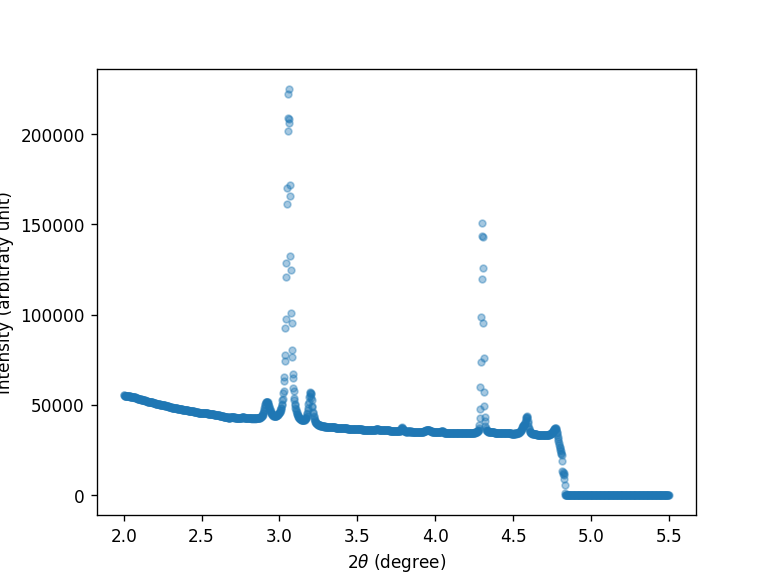

In [18]:
delta_start = 85
path_file = Path(path_int, "ps22017-00031_" + str(delta_start) + ".dat")
DATA = pd.read_csv(path_file, skiprows=22, delimiter = " ", skipinitialspace = True)

Tth_raw = DATA.values[:,0] # deg
I_raw = DATA.values[:,1]

fig = plt.figure()
plt.plot(Tth_raw, I_raw, marker="o", linestyle="none", alpha=0.4, markersize=4)
plt.yscale("linear")
plt.xlabel(r"$2\theta$ (degree)")
plt.ylabel("Intensity (arbitraty unit)")
fig.show()

-------------

For this exercise, we will only focus on the [1 1 1] diffraction peak of $Ti_{0.5}Al_{0.5}N$. Then, you can define a `Tth_rng` to crop the integrated data.

<IPython.core.display.Javascript object>


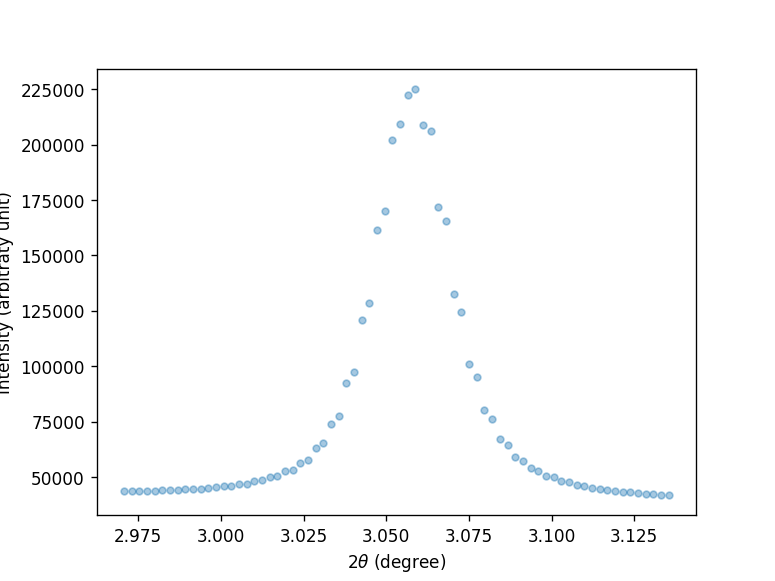

In [20]:
# Define a range of 2theta to crop the data arround the [1 1 1]
Tth_rng = [2.970,3.137]

crop = (Tth_raw > Tth_rng[0]) & (Tth_raw < Tth_rng[1])
Tth = Tth_raw[crop]
I = I_raw[crop]

#df_Tth=pd.DataFrame(Tth)

# Plot the croped [111] peak
fig = plt.figure()
plt.plot(Tth, I, marker="o", linestyle="none", alpha=0.4, markersize=4)
plt.yscale("linear")
plt.xlabel(r"$2\theta$ (degree)")
plt.ylabel("Intensity (arbitraty unit)")
fig.show()

#### Loading the whole dataset

The idea now is to load all the dataset for the XRD pattern of the image number 295 (with maximum load) into 2 variables:
- Tth the 2 theta values
- I the intensity

Tth  - will be an array of 1 dimension (1 column) representing the values of 2theta of the intensity

I - will be a 2 dimensional array, where each column will represent one azimuthal range, following this scheme:

<br>

$$
Tth = \begin{pmatrix}
2\theta_1 \\
2\theta_2 \\
\vdots    \\
2\theta_{final}
\end{pmatrix}
$$

<br>
<br>

$$
I = \begin{pmatrix}
I(2\theta_1, \delta_{rng} = [160, 170]) & I(2\theta_1, \delta_{rng} = [170, 180]) & ... & I(2\theta_1, \delta_{rng} = [230, 240])  \\
I(2\theta_2, \delta_{rng} = [160, 170]) & I(2\theta_2, \delta_{rng} = [170, 180]) & ... & I(2\theta_2, \delta_{rng} = [230, 240])  \\
\vdots & \vdots & \ddots & \vdots                    \\
I(2\theta_{final}, \delta_{rng} = [160, 170]) & I(2\theta_{final}, \delta_{rng} = [170, 180]) & ... & I(2\theta_{final}, \delta_{rng} = [230, 240])  \\
\end{pmatrix}
$$

-----

`Tth` had actually already been defined at the last step, we only need to define `I`  

In [21]:

# File to load
fileName = "ps22017-00031"
# Azimuthal angles to load (first bound)
azimuth_toLoad = np.arange(delta_bounds[0], delta_bounds[1], delta_step) # The last value (240) will not be included in the list which will then stop at 230 as we want

# We need to initialize "I" with np.zeros to the correct shape
I = np.zeros((len(Tth), len(azimuth_toLoad)))

# Then load all the file in a for loop 
# and sore them into I (without forgetting to apply the crop)
for ii in range(0, len(azimuth_toLoad)):
    path_file = Path(path_int, fileName + "_" + str(azimuth_toLoad[ii]) + ".dat")
    print(f"loading {path_file}   ...")
    DATA = pd.read_csv(path_file, skiprows=22, delimiter = " ", skipinitialspace = True)
    print (DATA)
    I[:,ii] = DATA.values[crop,1]

print("All done!")



loading C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_0.dat   ...
             #   2th_deg   I  Unnamed: 3
0     2.001160  55116.01 NaN         NaN
1     2.003479  54928.20 NaN         NaN
2     2.005799  54908.24 NaN         NaN
3     2.008118  54765.18 NaN         NaN
4     2.010437  54653.16 NaN         NaN
...        ...       ...  ..         ...
1504  5.489563      0.00 NaN         NaN
1505  5.491883      0.00 NaN         NaN
1506  5.494202      0.00 NaN         NaN
1507  5.496522      0.00 NaN         NaN
1508  5.498841      0.00 NaN         NaN

[1509 rows x 4 columns]
loading C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22017\integrated\ps22017-00031_5.dat   ...
             #   2th_deg   I  Unnamed: 3
0     2.001160  55484.54 NaN         NaN
1     2.003479  55389.72 NaN         NaN
2     2.005799  55318.63 NaN         NaN
3     2.008118  55238.99 NaN         NaN
4     2.010437  55142.19 NaN         NaN
...        ...       

C:\Users\NayakS\AppData\Local\Temp\ipykernel_20444\1160373525.py:2: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



<IPython.core.display.Javascript object>


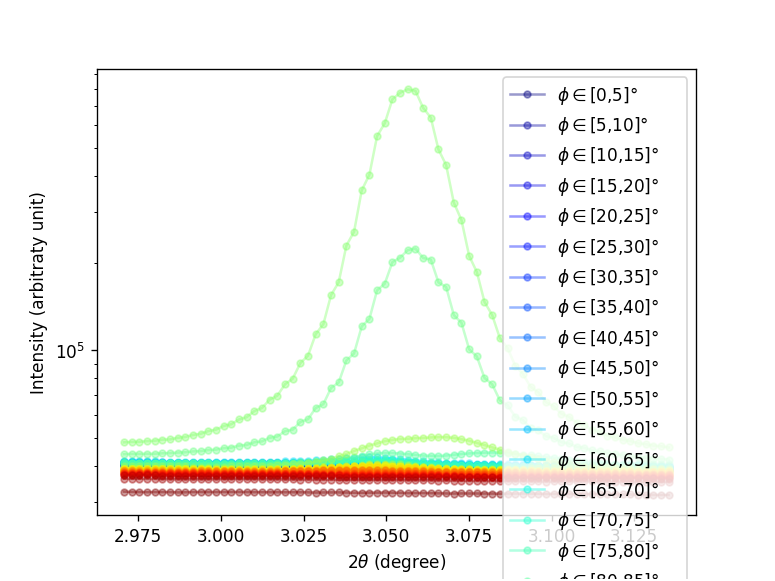

In [22]:
# We can also print them all now, in a for loop again:
cmap = cm.get_cmap('jet', len(azimuth_toLoad))

fig = plt.figure()
for ii in range(0, azimuth_toLoad.shape[0]):
    plt.plot(Tth, I[:,ii], marker="o", linestyle="-", alpha=0.4, markersize=4, \
             color=cmap(ii), label=f"$\phi \in$[{azimuth_toLoad[ii]},{azimuth_toLoad[ii]+delta_step}]°")
plt.yscale("log")
plt.xlabel(r"$2\theta$ (degree)")
plt.ylabel("Intensity (arbitraty unit)")
plt.legend()
fig.show()

## Removing the quick changes in the Data
 Remove stray data points from the plot 
<br>
With quick changes of I, difficult to fit data with a pseudo-Voight function 
<br>
Using Pandas DataFrame we remove I as well as 2$\theta$ values for which a quick changes is seen 
<br> 
Find the minimum intensity (`I_min`) below which data needs to be removed

C:\Users\NayakS\AppData\Local\Temp\ipykernel_20444\1338563697.py:4: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



<IPython.core.display.Javascript object>


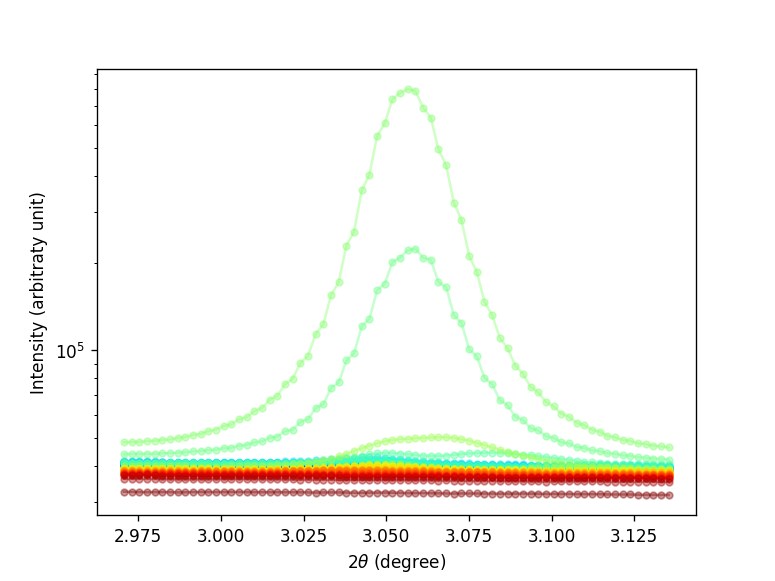

In [23]:
#We can also print them all now, in a for loop again:
I_min=0 #

cmap = cm.get_cmap('jet', len(azimuth_toLoad))
fig = plt.figure()
for ii in range(0, azimuth_toLoad.shape[0]):
        df_Tth=pd.DataFrame(Tth)
        df_Int=pd.DataFrame(I[:,ii])
        df_xx=pd.concat([df_Tth,df_Int],axis=1)
        df_xx=df_xx[df_xx.iloc[:,1]>I_min]  # keep all data where intensity is higher than I_min 
   # df_xx.columns=["two_theta", "Int"]
    #df_new=df_xx[df_xx.iloc[:1]>300]
        plt.plot(df_xx.iloc[:,0], df_xx.iloc[:,1], marker="o", linestyle="-", alpha=0.4, markersize=4, \
                 color=cmap(ii), label=f"$\phi \in$[{azimuth_toLoad[ii]},{azimuth_toLoad[ii]+delta_step}]°")
plt.yscale("log")
plt.xlabel(r"$2\theta$ (degree)")
plt.ylabel("Intensity (arbitraty unit)")
#plt.legend()
fig.canvas.draw()
fig.canvas.flush_events()

> This plot is also the occasion to check if the `Tth_rng` you have chosen is correct for ALL the integrated curves. If not, you can modify it and run all the cells until here again. 

# Peak fitting
<a name="7"></a>

Now that all the data reduction are done, we will need to find the peak position for each `delta_rng`. In order to get these peak position, we will fit the experimental data to a Pseudo-Voigt model (you can also use a Pearson7 model, or a Voigt model if you prefer). 

We will use lmfit package to do it (https://lmfit.github.io/lmfit-py/builtin_models.html#pseudovoigtmodel).

------

In the lmfit package, the pseudo-voigt model is build-in (as well as Pearson7 and Voigt) so let's use it:

In [24]:
# We will call this model "peak_model" 
peak_model = lmfit.models.PseudoVoigtModel(prefix='peak_')


By default this model have 4 independent parameters 
- `amplitude` : The amplitude of the Pseudo-Voigt 
- `center` : The center of the Pseudo-Voigt 
- `fraction` : The fraction of Lorentzian and Gaussian contribution of the Pseudo-Voigt 
- `sigma` : The dispersion of the Pseudo-Voigt 

Another 2 parameters (`height` and `fwhm` Full Width Half Maximum) are introduced to the model, but are actually calculated from to the value of `amplitude` and `sigma` respectively.

The detail on how the model is define can be found in: https://lmfit.github.io/lmfit-py/builtin_models.html#pseudovoigtmodel

-----

We will need to initialize them at one value which will be use as initial guess for the least square fitting algorithm performed afterward.

In [26]:
# This define the parameter list as defined by the "PseudoVoigtModel" of lmfit
pars = peak_model.make_params()
pars['peak_amplitude'].set(value=1000, min=10, max=10000)
pars['peak_center'].set(value=3.05,  min=3.025, max=3.125)
pars['peak_fraction'].set(value=0.5, min=0, max=1) # (Some papers allow the fraction to be higher than 1)
pars['peak_sigma'].set(value=0.02,    min=0.005, max=0.5) 

# We can check the values of the parameters and their boundaries with:
pars.pretty_print(oneline=False, colwidth=12, columns=['value', 'min', 'max'])

Name                   Value          Min          Max
peak_amplitude          1000           10        1e+04
peak_center             3.05        3.025        3.125
peak_fraction            0.5            0            1
peak_fwhm               0.04         -inf          inf
peak_height         1.97e+04         -inf          inf
peak_sigma              0.02        0.005          0.5


We can then compute the values of the model at the Tth values, and plot the initial guess along with the experimental data:

C:\Users\NayakS\AppData\Local\Temp\ipykernel_20444\2695431999.py:5: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



<IPython.core.display.Javascript object>


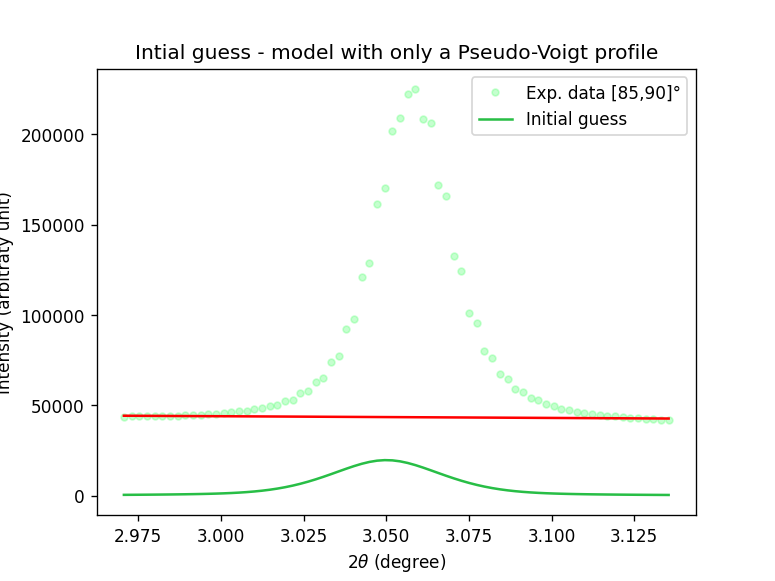

In [27]:
# This compute the intensity with the given model and parameters, at x = Tth (our 2theta values)
I_calc_init = peak_model.eval(pars, x=df_xx.iloc[:,0])

# Plot
cmap = cm.get_cmap('jet', len(azimuth_toLoad))

fig = plt.figure()
ii = 17 # We will sart with ii = 0 (delta = [160, 170])

df_Tth=pd.DataFrame(Tth)
df_Int=pd.DataFrame(I[:,ii])
df_xx=pd.concat([df_Tth,df_Int],axis=1)
df_xx=df_xx[df_xx.iloc[:,1]>I_min]

plt.plot(df_xx.iloc[:,0], df_xx.iloc[:,1], marker="o", linestyle="none", alpha=0.4, markersize=4, \
         color=cmap(ii), label=f"Exp. data [{azimuth_toLoad[ii]},{azimuth_toLoad[ii]+delta_step}]°")

plt.plot(df_xx.iloc[:,0], I_calc_init, '-', color = [40/255, 190/255, 70/255], label = "Initial guess")

plt.yscale("linear")
plt.xlabel(r"$2\theta$ (degree)")
plt.ylabel("Intensity (arbitraty unit)")
plt.title("Intial guess - model with only a Pseudo-Voigt profile")
plt.legend()
fig.show()

## Background Correction
To have a good fit of the experimental data, it become obvious that we will need to model the background as well.

There are many model of background that could be adapted, here we used the library of `PeakUtils`[https://peakutils.readthedocs.io/en/latest/]

It uses a iterative polynomial regression algorithm to compute baseline.

In [28]:
baseline_values = peakutils.baseline(df_xx.iloc[:,1],deg=1,max_it=500,tol=1e-3)

In [29]:
plt.plot(df_xx.iloc[:,0],baseline_values,"r")

C:\Users\NayakS\AppData\Local\Temp\ipykernel_20444\4155901400.py:1: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



<IPython.core.display.Javascript object>


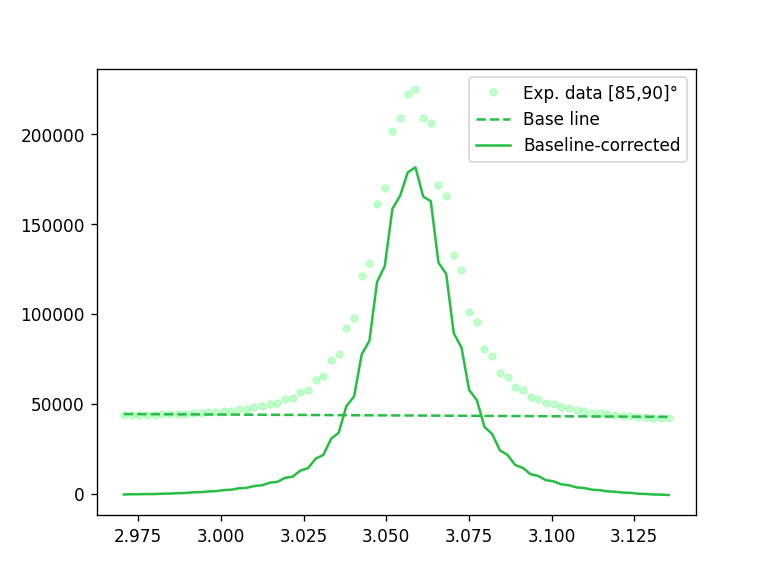

In [30]:
cmap = cm.get_cmap('jet', len(azimuth_toLoad))

fig = plt.figure()
plt.plot(df_xx.iloc[:,0],df_xx.iloc[:,1], marker="o", linestyle="none", alpha=0.4, markersize=4, \
         color=cmap(ii), label=f"Exp. data [{azimuth_toLoad[ii]},{azimuth_toLoad[ii]+delta_step}]°")
plt.plot(df_xx.iloc[:,0],baseline_values, '--', color = [40/255, 190/255, 70/255], label = "Base line")
plt.plot(df_xx.iloc[:,0],df_xx.iloc[:,1]-baseline_values, '-', color = [40/255, 190/255, 70/255], label = "Baseline-corrected")
plt.legend()
fig.show()


C:\Users\NayakS\AppData\Local\Temp\ipykernel_20444\2052474616.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



<IPython.core.display.Javascript object>


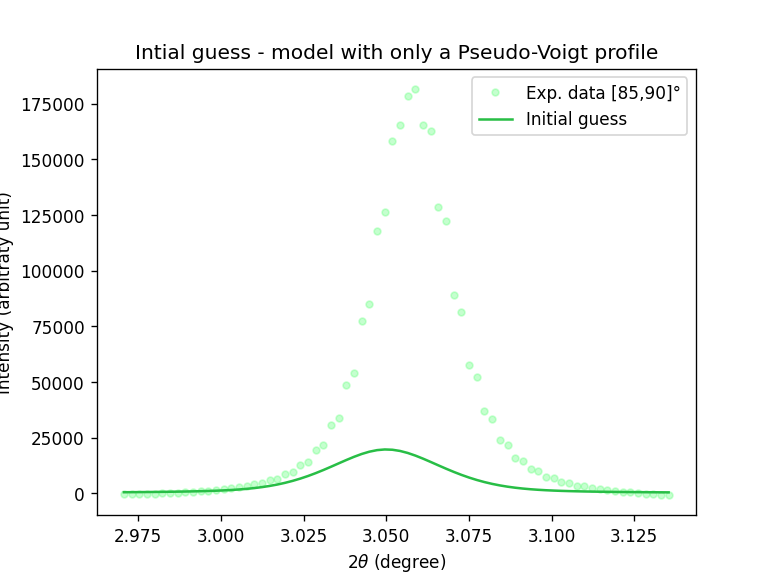

In [31]:
# This compute the intensity with the given model and parameters, at x = Tth (our 2theta values)

df_Tth=pd.DataFrame(Tth)
df_Int=pd.DataFrame(I[:,ii])
df_xx=pd.concat([df_Tth,df_Int],axis=1)
df_xx=df_xx[df_xx.iloc[:,1]>I_min]

df_base_corr=df_xx.iloc[:,1]-baseline_values

I_calc_init = peak_model.eval(pars, x=df_xx.iloc[:,0])

# Plot
cmap = cm.get_cmap('jet', len(azimuth_toLoad))

fig = plt.figure()


ii = 17 # We will sart with ii = 0 (delta = [160, 170])


plt.plot(df_xx.iloc[:,0], df_base_corr, marker="o", linestyle="none", alpha=0.4, markersize=4, \
         color=cmap(ii), label=f"Exp. data [{azimuth_toLoad[ii]},{azimuth_toLoad[ii]+delta_step}]°")

plt.plot(df_xx.iloc[:,0], I_calc_init, '-', color = [40/255, 190/255, 70/255], label = "Initial guess")

plt.yscale("linear")
plt.xlabel(r"$2\theta$ (degree)")
plt.ylabel("Intensity (arbitraty unit)")
plt.title("Intial guess - model with only a Pseudo-Voigt profile")
plt.legend()
fig.show()

C:\Users\NayakS\AppData\Local\Temp\ipykernel_20444\3952813248.py:28: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



<IPython.core.display.Javascript object>


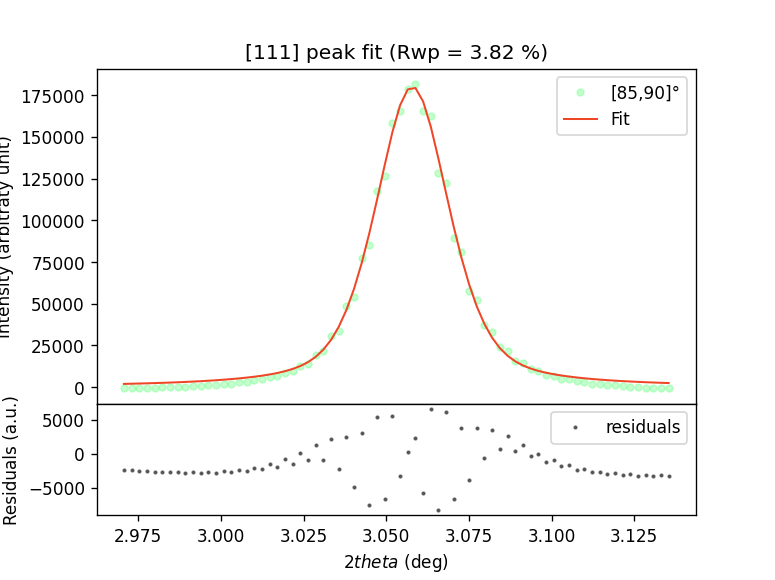

[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 65
    # data points      = 72
    # variables        = 4
    chi-square         = 7.2757e+18
    reduced chi-square = 1.0700e+17
    Akaike info crit   = 2827.11699
    Bayesian info crit = 2836.22365
    R-squared          = -36940586.8
[[Variables]]
    peak_amplitude:  6260.92829 +/- 265.220368 (4.24%) (init = 1000)
    peak_center:     3.05786123 +/- 9.4457e-05 (0.00%) (init = 3.05)
    peak_sigma:      0.01326208 +/- 1.7217e-04 (1.30%) (init = 0.02)
    peak_fraction:   0.58366108 +/- 0.10125651 (17.35%) (init = 0.5)
    peak_fwhm:       0.02652416 +/- 3.4434e-04 (1.30%) == '2.0000000*peak_sigma'
    peak_height:     180031.199 +/- 1055.16746 (0.59%) == '(((1-peak_fraction)*peak_amplitude)/max(1e-15, (peak_sigma*sqrt(pi/log(2))))+(peak_fraction*peak_amplitude)/max(1e-15, (pi*peak_sigma)))'
[[Correlations]] (unreported correlations are < 0.100)
    C(peak_amplitude, peak_fraction) = +0.9686
    C(peak_sig

In [32]:
ii = 17  # We will sart with ii = 0 (delta = [0, 90])


df_base_corr = df_xx.iloc[:,1]-baseline_values
# A common practice for XRD peak fitting is to weight the fit by the 1/I or the square root of 1/I.
# This way, the fit will not accord too much importance to the high values of the diffraction pattern. 
# (We should however be careful that none of the yy values are equal to 0...)
#################################
#wgt = np.sqrt(1/yy)
#wgt = np.log(yy)
wgt = df_base_corr
#################################
# Fittingx
#pars = model.guess(yy, x=Tth)

out = peak_model.fit(df_base_corr, pars, x=df_xx.iloc[:,0], weights=wgt,nan_policy='omit',
                     calc_covar=True,fit_kws={"ftol":1e-22, "xtol":1e-10, "gtol":1e-22}) #fitting

# The fitted intensity can be found with:
I_fit = out.best_fit

# To evaluate the goodness of the fit, the value of Rwp is often used (again, the smaller Rwp the better)
# Here is the formula to calculate it:
Rwp  = (np.sqrt(np.sum(wgt*(df_base_corr-out.best_fit)**2) / np.sum(wgt*df_base_corr**2))) * 100;


# Plot - I propose this type of plots, allowing to see the residuals (I_experiment - I_fitted)
cmap = cm.get_cmap('jet', azimuth_toLoad.shape[0])

fig = plt.figure()
grid = fig.add_gridspec(4, 1, hspace=0)

ax1 = plt.subplot(grid[0:3, 0])
plt.plot(df_xx.iloc[:,0], df_base_corr, marker="o", linestyle="none", alpha=0.4, markersize=4,\
         color=cmap(ii), label=f"[{azimuth_toLoad[ii]},{azimuth_toLoad[ii]+delta_step}]°")
plt.plot(df_xx.iloc[:,0], I_fit, '-', color = [240/255, 70/255, 40/255], linewidth=1.2, label = "Fit")
#plt.plot(Tth, baseline_values, '-', color = [130/255, 130/255, 130/255], linewidth=1.2, label = "Background")

plt.yscale("linear")
plt.xlabel(r"$2\theta$ (degree)")
plt.ylabel("Intensity (arbitraty unit)")
plt.title(f"[111] peak fit (Rwp = {np.round(Rwp*100)/100} %)")
plt.legend()

ax2 = plt.subplot(grid[3, 0], sharex=ax1)
plt.plot(df_xx.iloc[:,0], df_base_corr-I_fit, 'o', markersize = 1.5, alpha = 0.6,\
         color = [30/255, 30/255, 30/255], label = "residuals")
plt.legend(loc='best')
plt.xlabel(r"$2 theta$ (deg)")
plt.ylabel("Residuals (a.u.)")

fig.show()


#from lmfit import Parameters, fit_report, minimize
#result1 = minimize(peak_model, pars, args=(df_xx.iloc[:,0], df_base_corr))
print(fit_report(out))


In [33]:
#out.params.get('peak_center').value
print(out.params.get('peak_center').stderr)
#out.params.get('peak_fwhm').value

9.445697972606527e-05


In [34]:
out

In [35]:
for key in out.params:
    print(key, "=", out.params[key].value, "+/-", out.params[key].stderr)

peak_amplitude = 6260.928289847552 +/- 265.22036792980344
peak_center = 3.057861226397653 +/- 9.445697972606527e-05
peak_sigma = 0.013262077730671704 +/- 0.00017217093856126836
peak_fraction = 0.5836610803924731 +/- 0.10125650834328055
peak_fwhm = 0.02652415546134341 +/- 0.0003443418778464935
peak_height = 180031.19858256186 +/- 1055.1674578538255


> You can check if the fit seems correct  in both linear and log-scale. log-scale will enhance the errors at the peak base but minimize them at the summit...

We can print the report from the fit, with the output values, confidence intervals and the $\chi^2$ of the fit (the lower $\chi^2$, the better fit).

> Looking at the value of y1 and y2 and the associated confidence interval we may try to reduce the polynomial order of the background to 1 or even 0, which would certainly increase a little bit the stability of the fit...  But it may not be the case for the other delta_rng !

#### Fitting of all the delta_rng

We will need to iteratively do the same operation on all of the curves to cover all of the delta_rng. We will use the same initial guess for all the fits for now. 

For our study, we will only need the value of the center of the peak, but we will save the 7 independent parameters of our model (4 for the Pseudo-Voigt, 3 for the Background) for safety (to be able to recompute the Pseudo-Voigt later for instance).

chi2 = 32311183087.829674


<IPython.core.display.Javascript object>


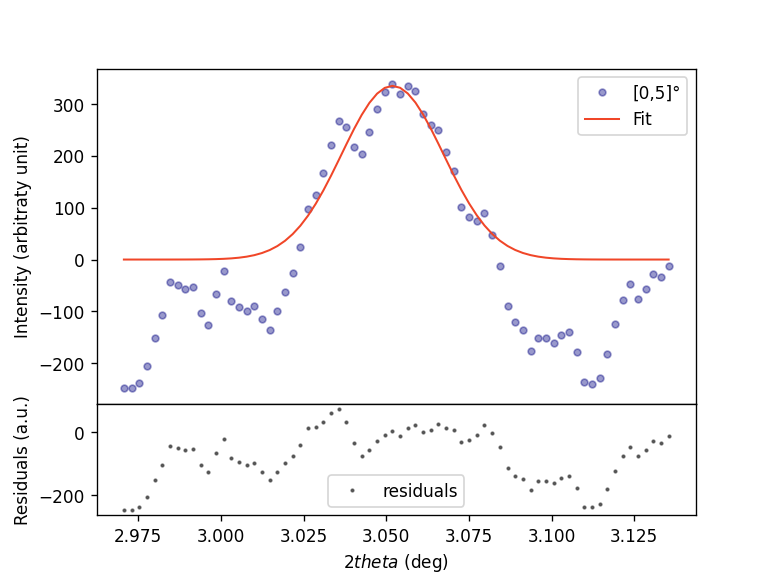

chi2 = 1939549686.0714862


<IPython.core.display.Javascript object>


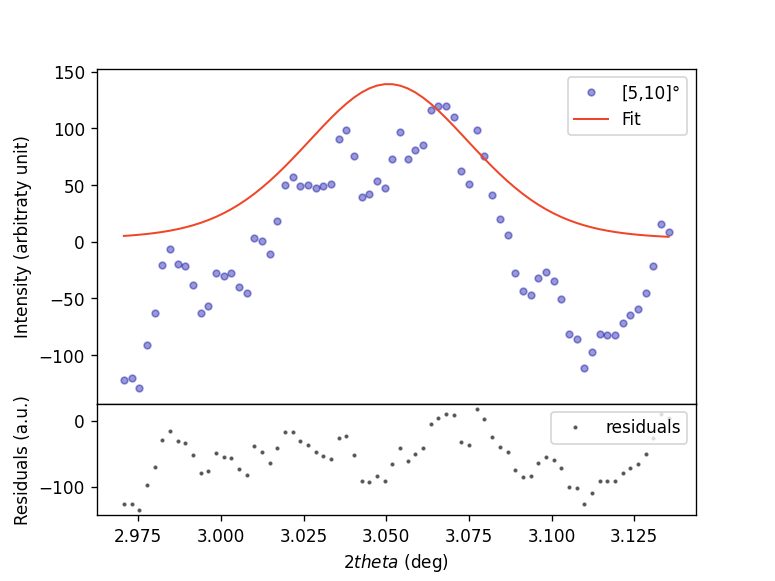

chi2 = 3928507750.0351644


<IPython.core.display.Javascript object>


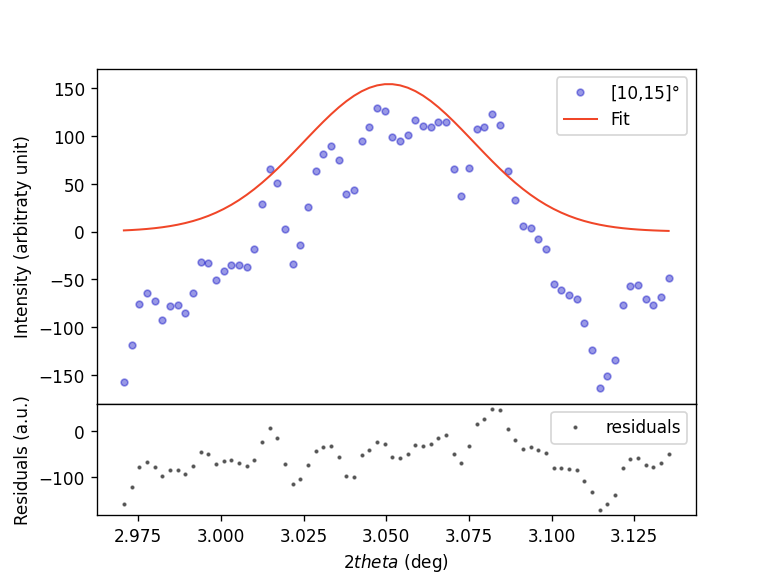

chi2 = 2593417393.475569


<IPython.core.display.Javascript object>


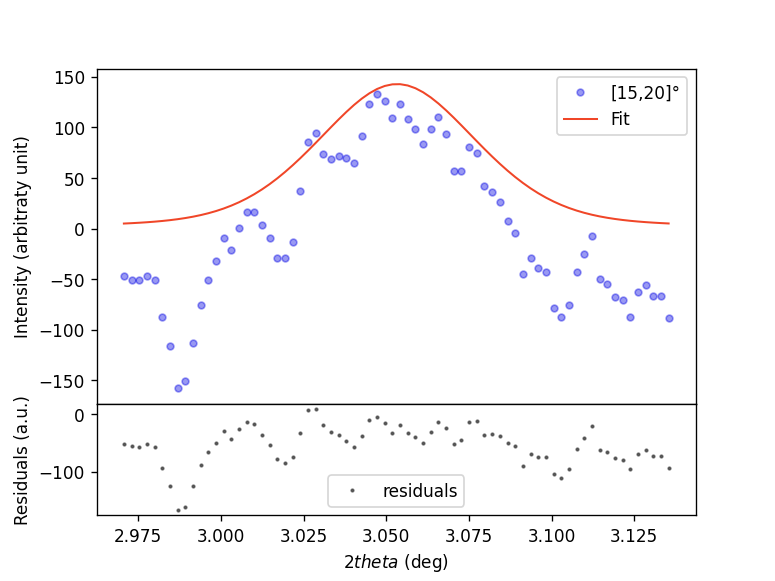

chi2 = 3457332336.5879164


<IPython.core.display.Javascript object>


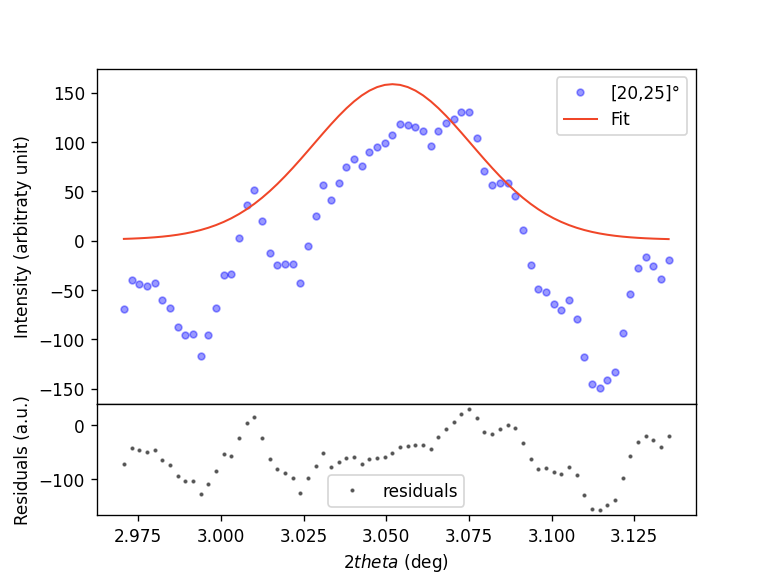

chi2 = 3230872189.6302166


<IPython.core.display.Javascript object>


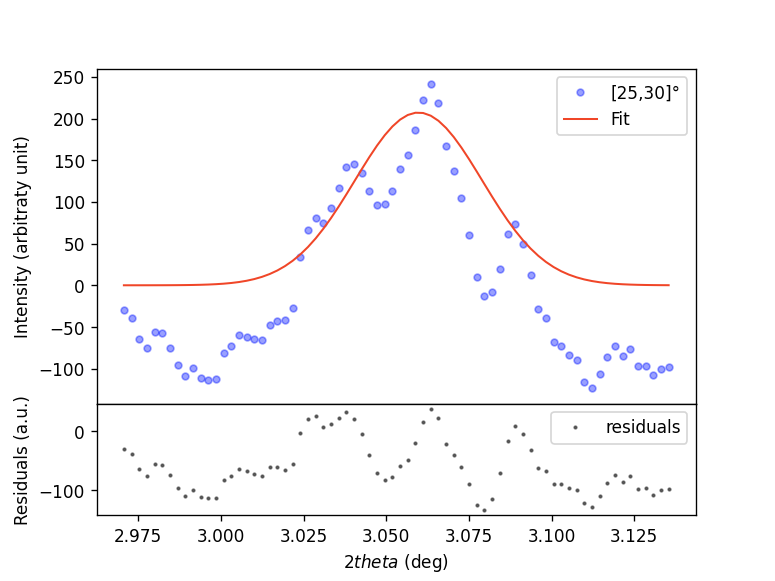

chi2 = 5116008810.372604


<IPython.core.display.Javascript object>


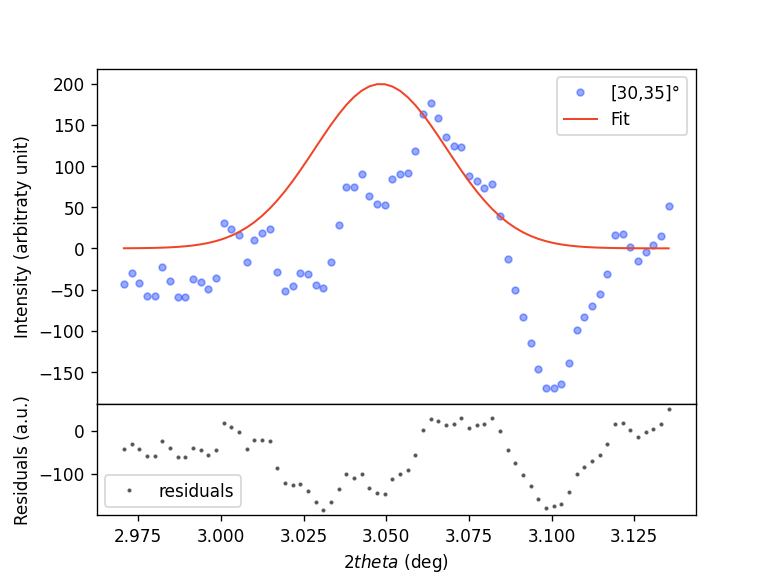

chi2 = 23472559457.12876


<IPython.core.display.Javascript object>


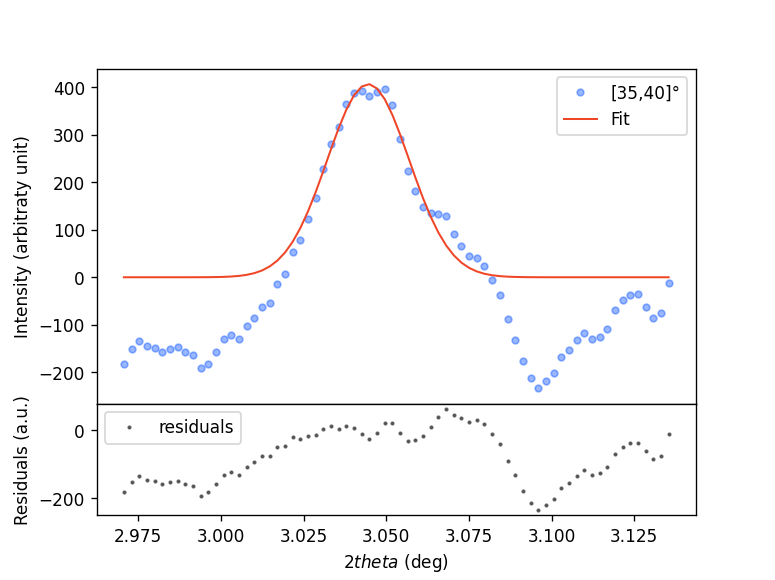

chi2 = 133607946175.02695


<IPython.core.display.Javascript object>


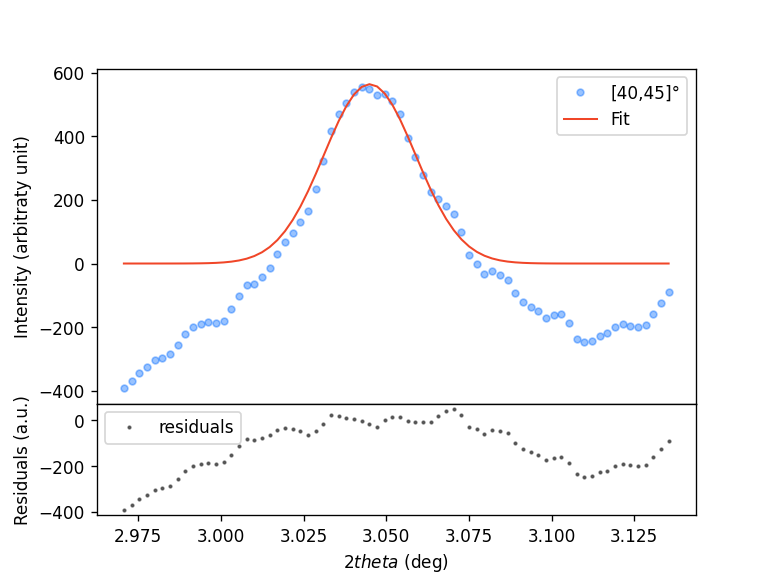

chi2 = 2542773511.9961996


C:\Users\NayakS\AppData\Local\Temp\ipykernel_20444\3926220965.py:40: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



<IPython.core.display.Javascript object>


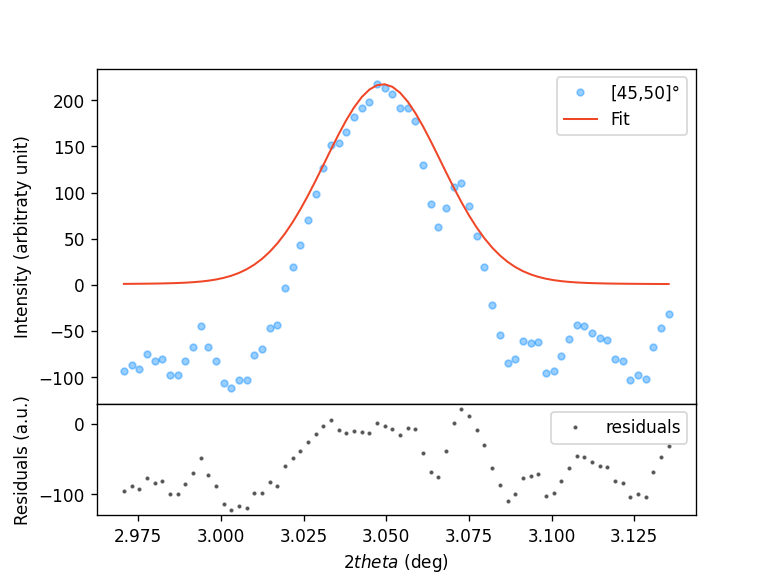

chi2 = 11228924168.119497


<IPython.core.display.Javascript object>


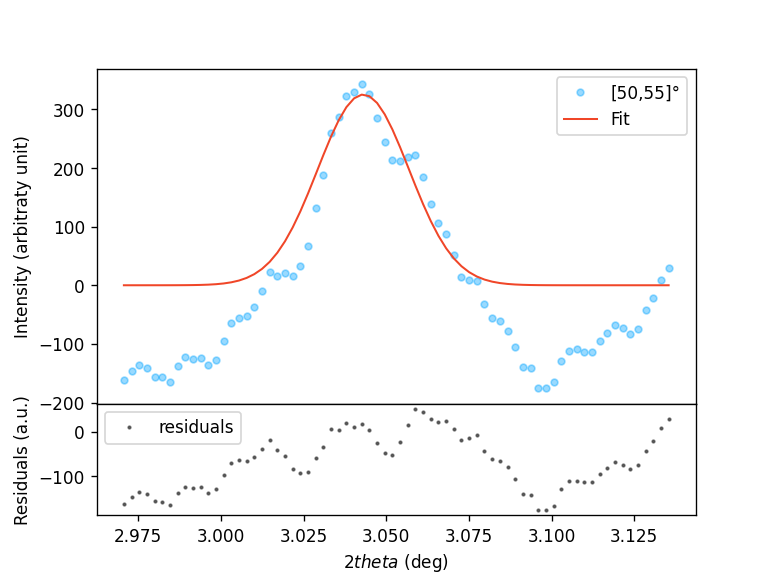

chi2 = 162057345307.01562


<IPython.core.display.Javascript object>


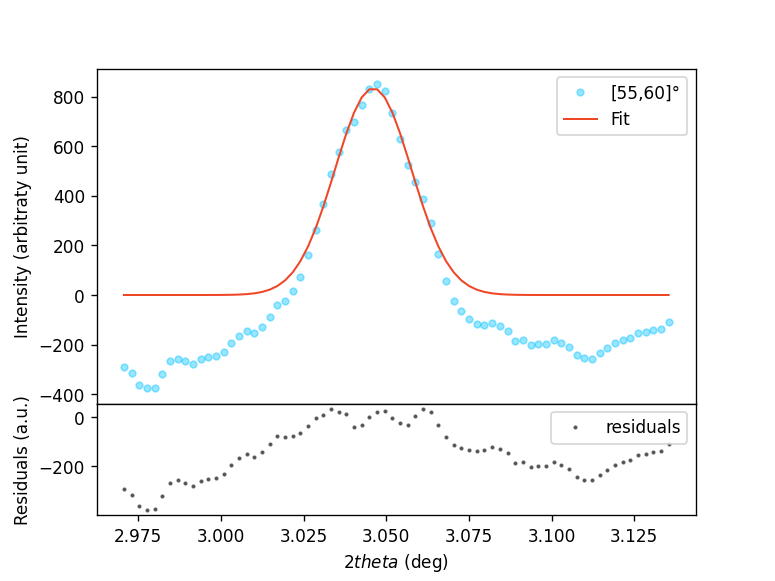

chi2 = 938364312179.0962


<IPython.core.display.Javascript object>


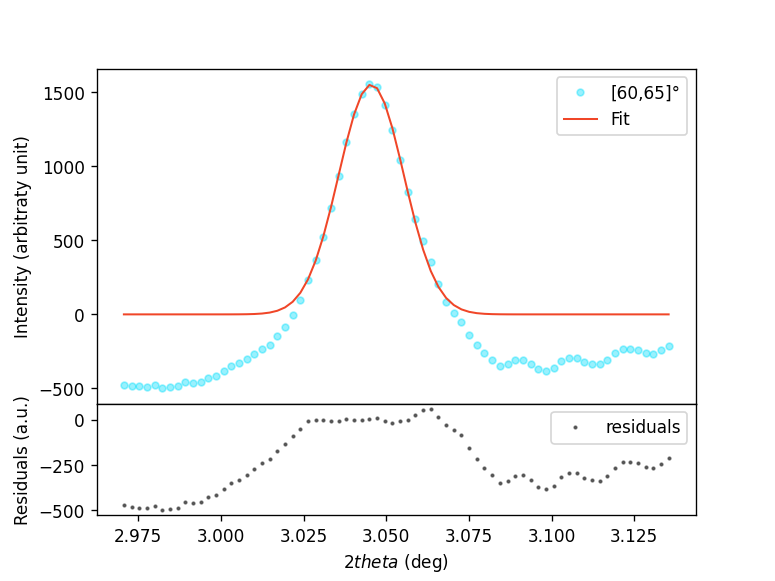

chi2 = 445839370109.0553


<IPython.core.display.Javascript object>


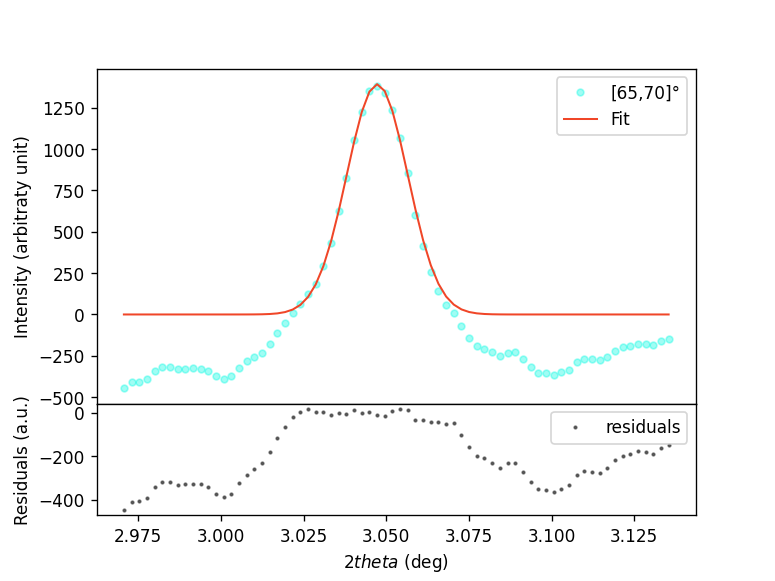

chi2 = 198870981260.7746


<IPython.core.display.Javascript object>


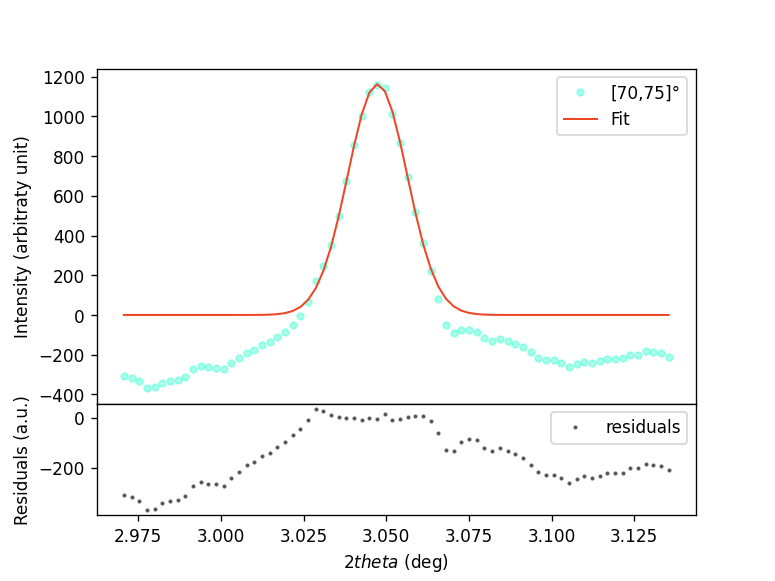

chi2 = 1335684139214.1619


<IPython.core.display.Javascript object>


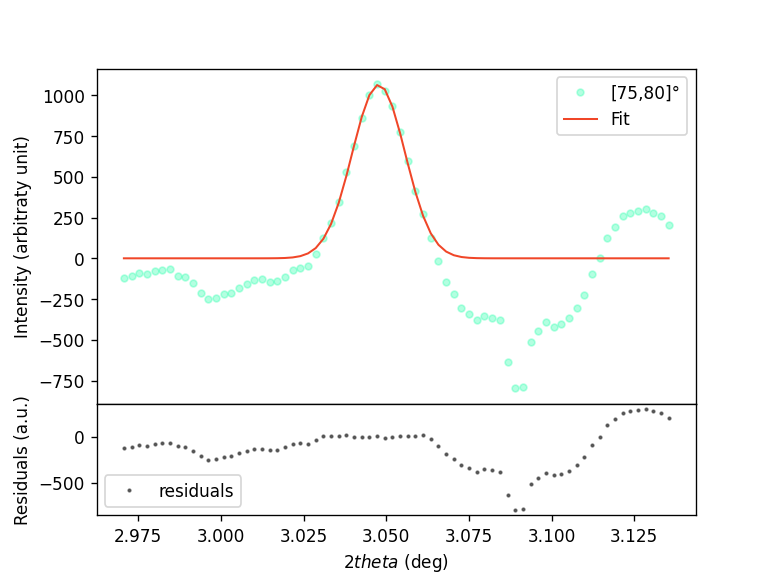

chi2 = 427662537355985.1


<IPython.core.display.Javascript object>


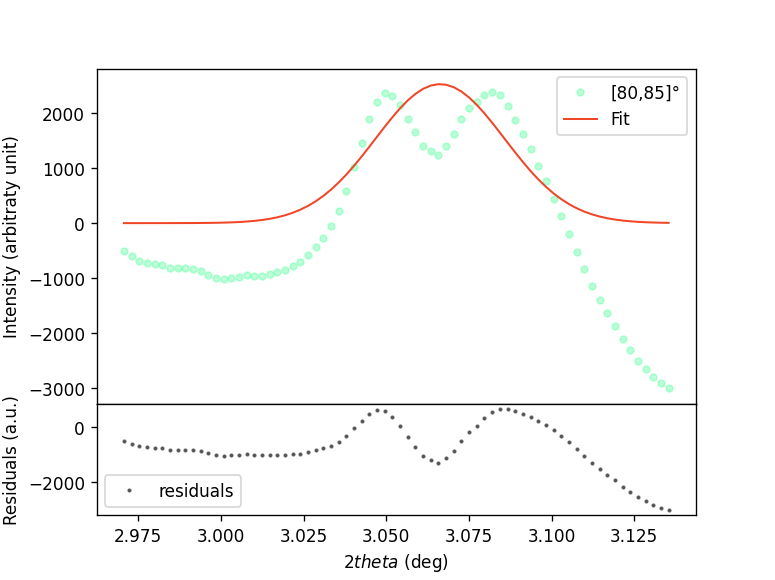

chi2 = 7.022103506553977e+18


<IPython.core.display.Javascript object>


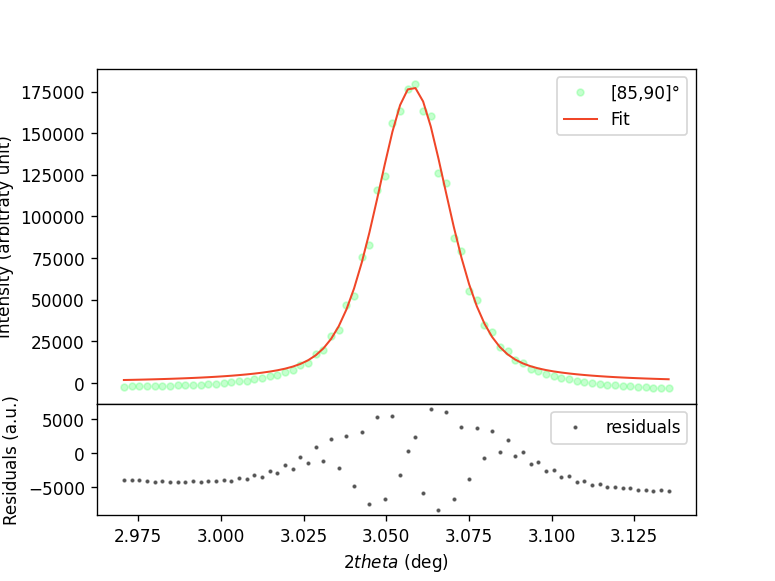

chi2 = 1.5005107287235734e+23


<IPython.core.display.Javascript object>


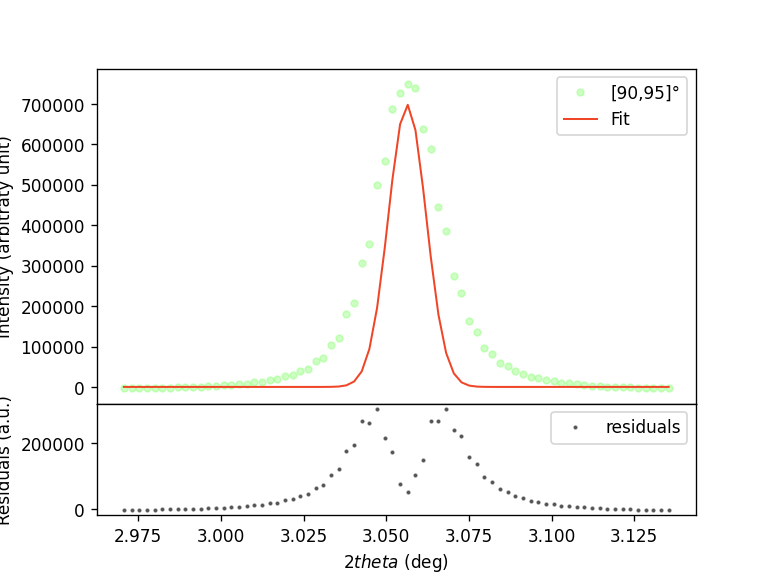

chi2 = 377444773150399.2


<IPython.core.display.Javascript object>


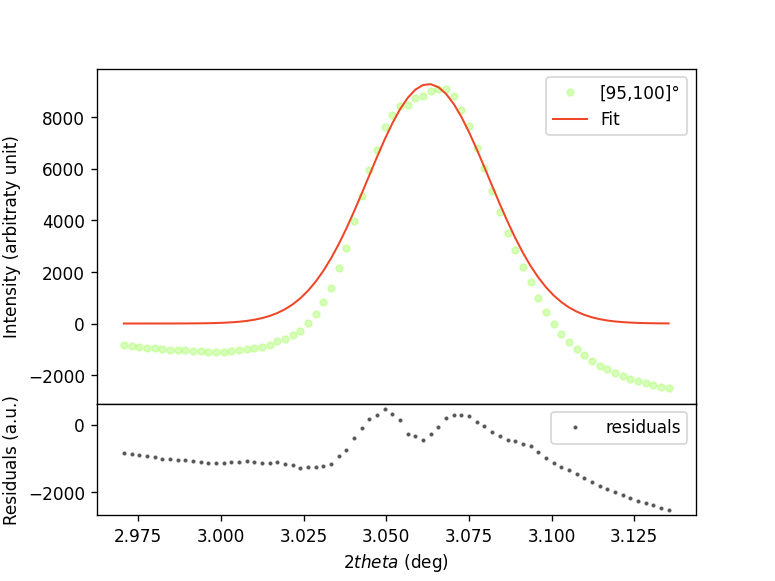

chi2 = 289871510488.80743


<IPython.core.display.Javascript object>


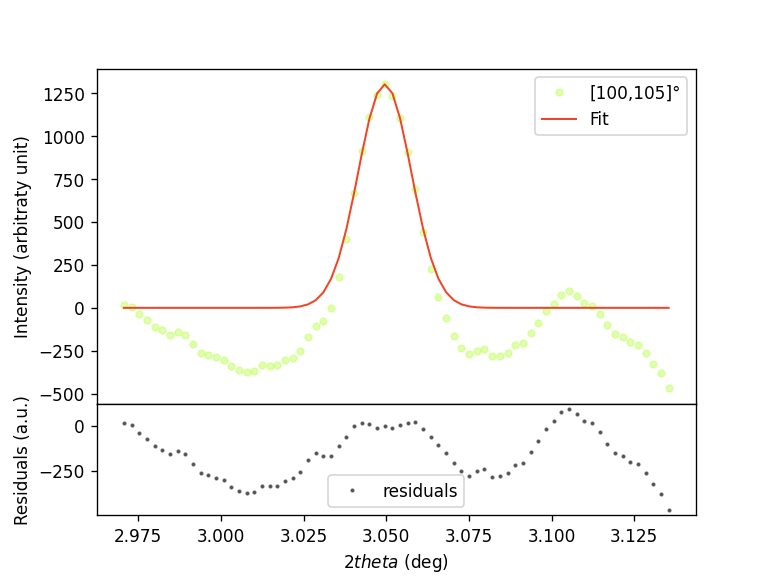

chi2 = 100761929177.89609


<IPython.core.display.Javascript object>


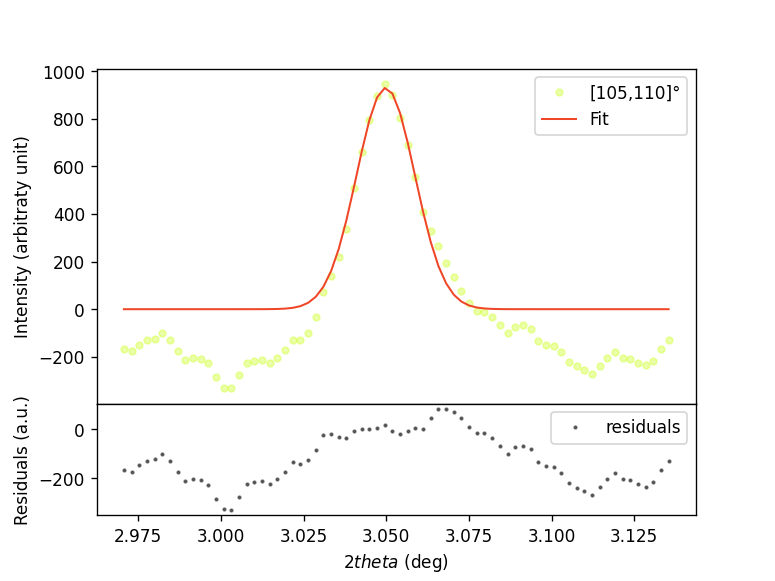

chi2 = 273473550712.09784


<IPython.core.display.Javascript object>


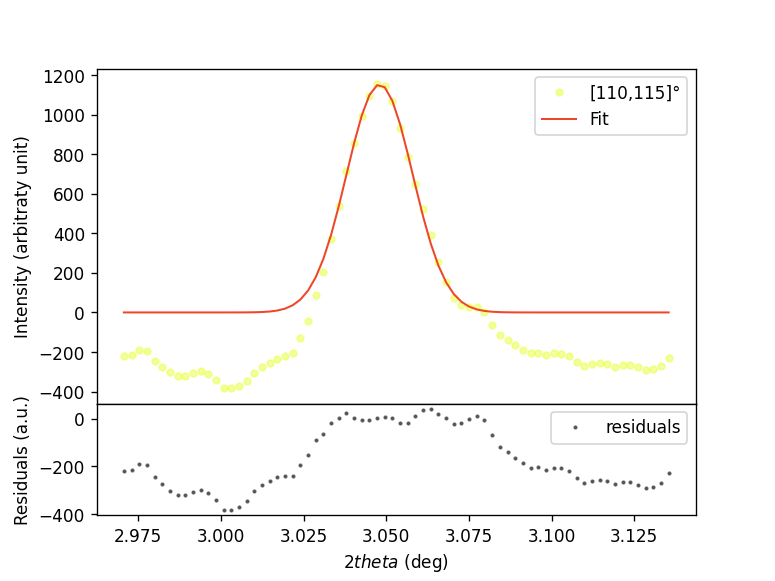

chi2 = 522753715791.0878


<IPython.core.display.Javascript object>


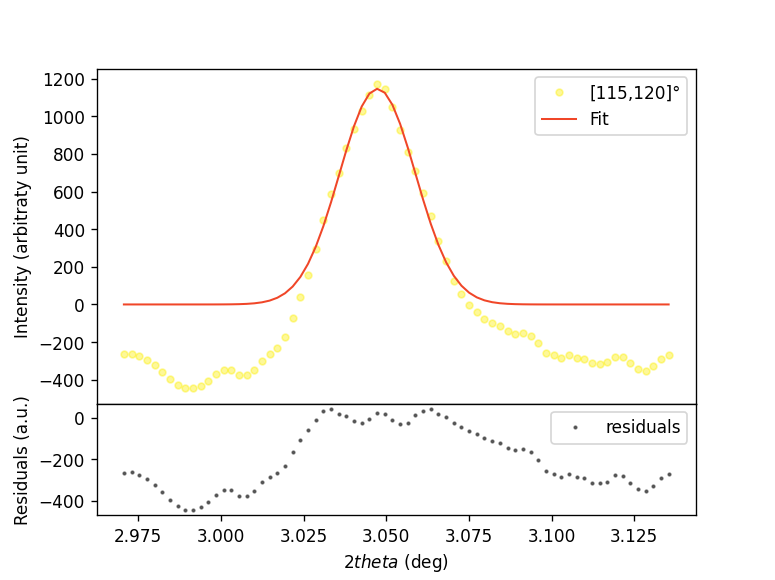

chi2 = 213773406435.0374


<IPython.core.display.Javascript object>


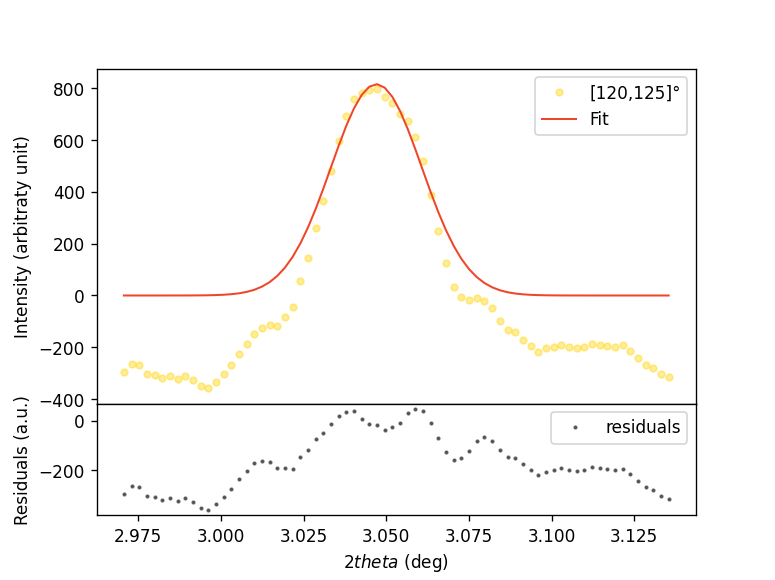

chi2 = 22504924439.806995


<IPython.core.display.Javascript object>


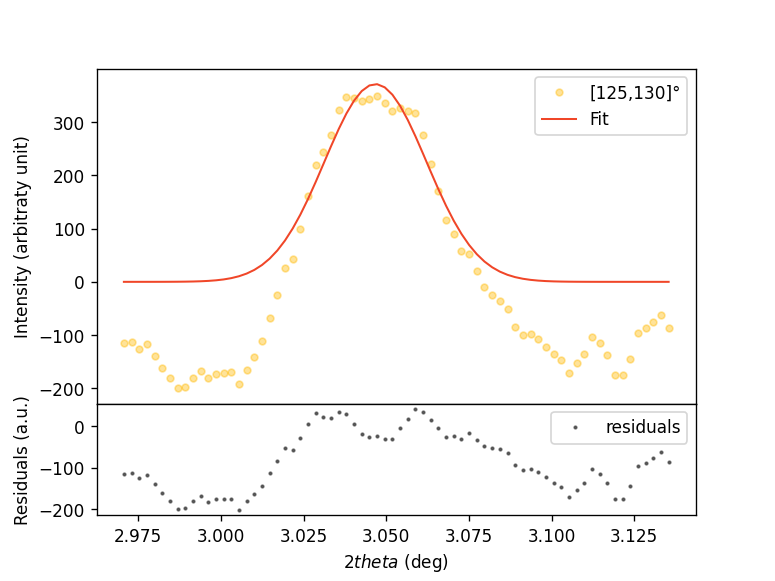

chi2 = 14343249303.982893


<IPython.core.display.Javascript object>


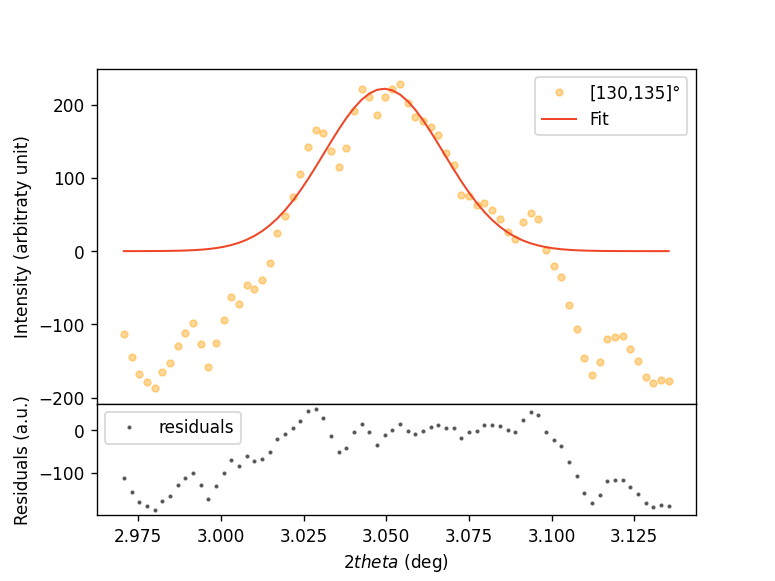

chi2 = 23421052333.663517


<IPython.core.display.Javascript object>


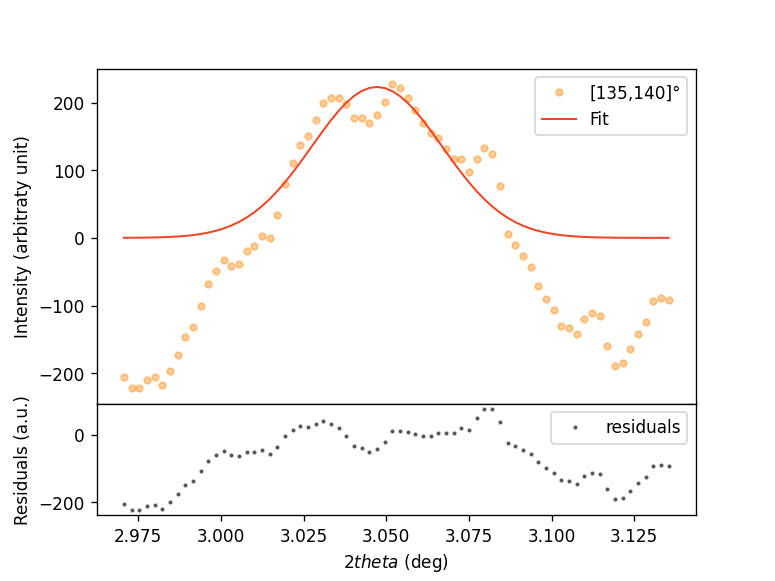

chi2 = 228471203522.75922


<IPython.core.display.Javascript object>


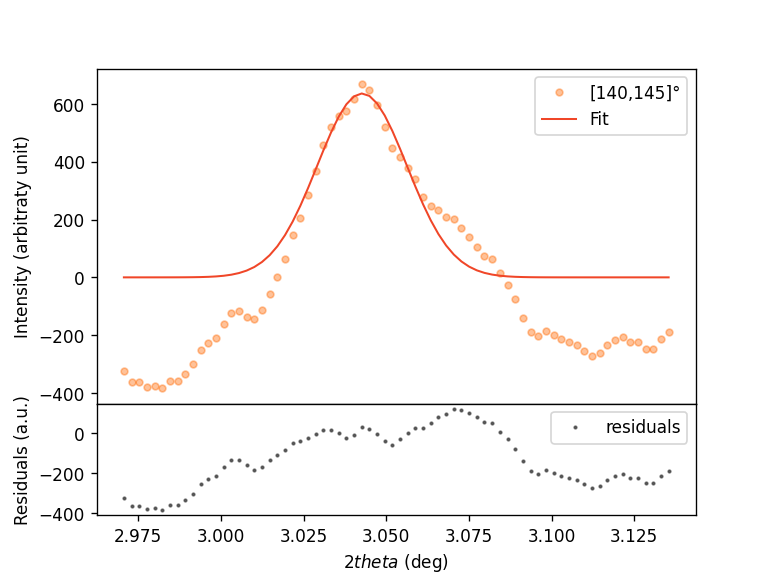

chi2 = 6971850831.525641


<IPython.core.display.Javascript object>


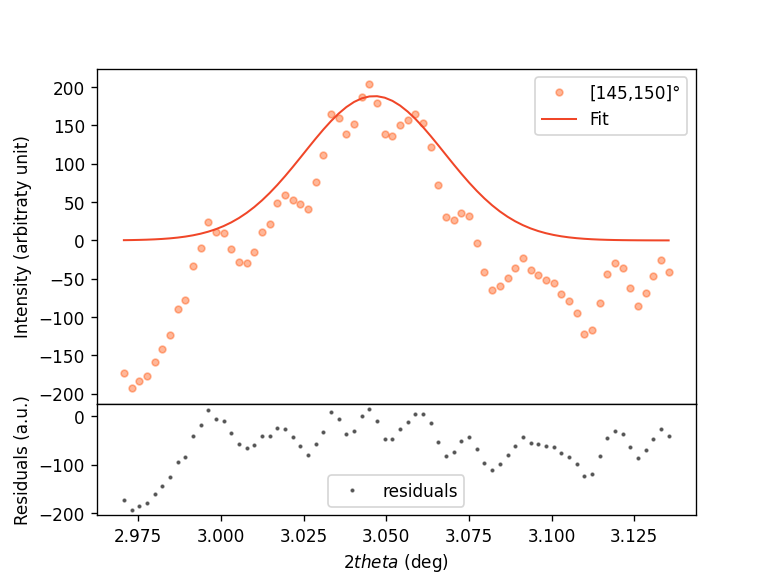

chi2 = 2287675847.0735745


<IPython.core.display.Javascript object>


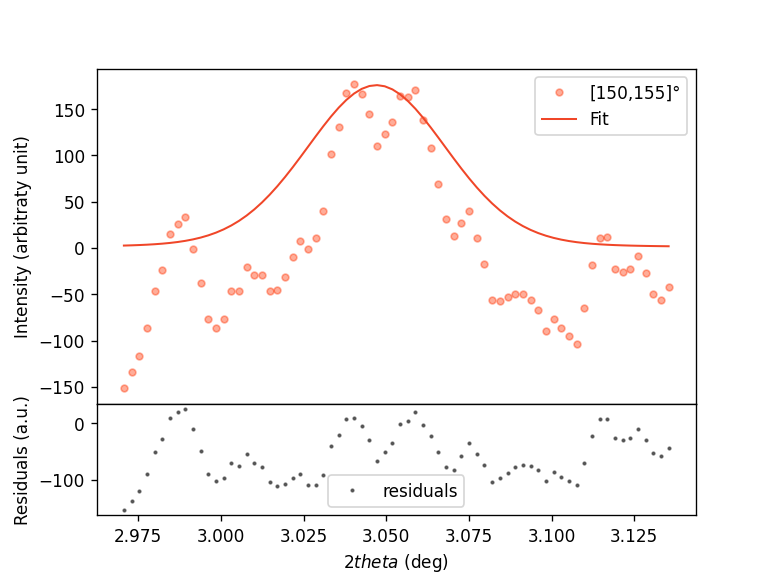

chi2 = 3137572167.5971203


<IPython.core.display.Javascript object>


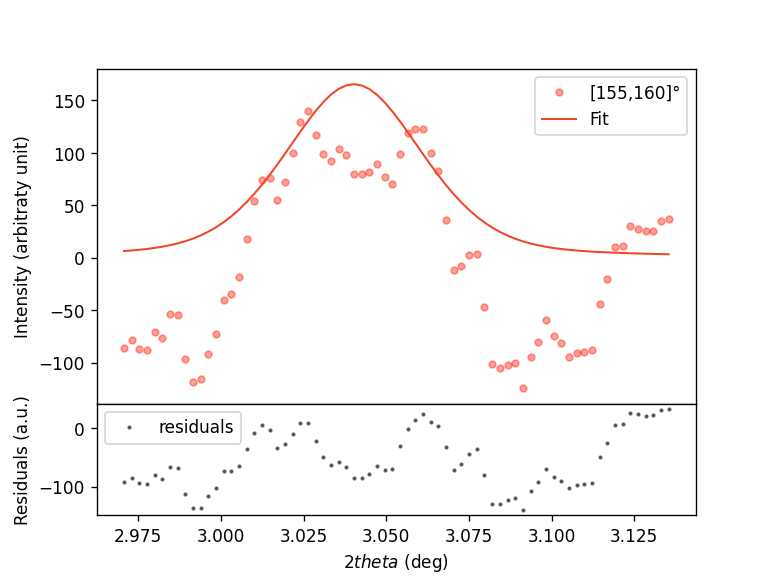

chi2 = 1071385483.0790797


<IPython.core.display.Javascript object>


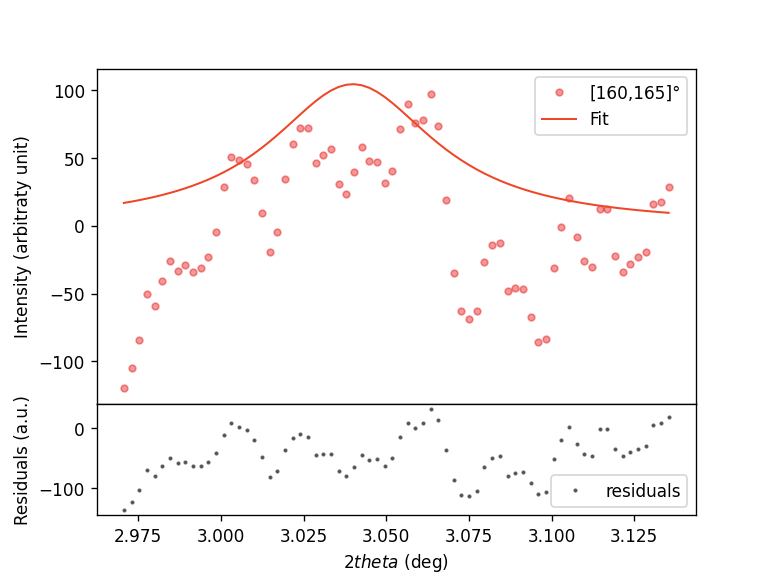

chi2 = 1030934914.0688655


<IPython.core.display.Javascript object>


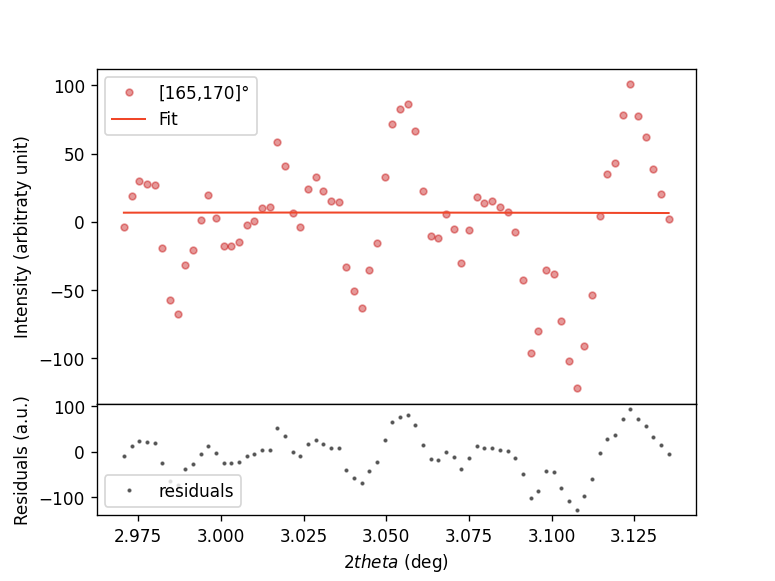

chi2 = 1440926523.908118


<IPython.core.display.Javascript object>


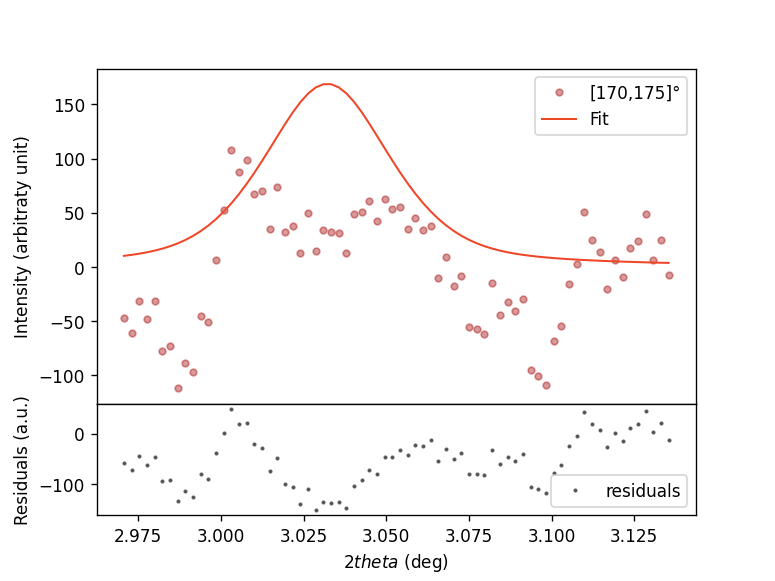

chi2 = 1820012235.4188044


<IPython.core.display.Javascript object>


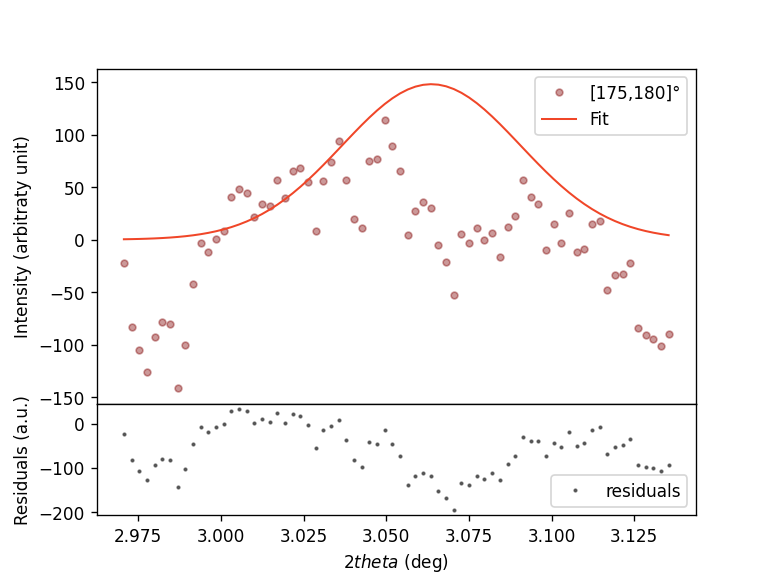

All done!


In [36]:
# At the end of all the refinements there will have azimuth_toLoad.shape[0] (= 8) values:
center = np.zeros(azimuth_toLoad.shape[0])
center_err=np.zeros(azimuth_toLoad.shape[0])
Amp = np.zeros(azimuth_toLoad.shape[0])
frac = np.zeros(azimuth_toLoad.shape[0])
s = np.zeros(azimuth_toLoad.shape[0])
Int=np.zeros(azimuth_toLoad.shape[0])


# Now we can do the itterative fitting of the curves:
for ii in range(0, azimuth_toLoad.shape[0]):  
    df_Tth=pd.DataFrame(Tth)
    df_Int=pd.DataFrame(I[:,ii])
    df_xx=pd.concat([df_Tth,df_Int],axis=1)
    df_xx=df_xx[df_xx.iloc[:,1]>I_min]
    baseline_values=peakutils.baseline(df_xx.iloc[:,1],deg=1,max_it=100,tol=1e-2)
    df_base_corr = df_xx.iloc[:,1]-baseline_values
   # wgt = np.sqrt(1/yy)
    wgt = df_base_corr

    # Fitting
    out = peak_model.fit(df_base_corr, pars, x=df_xx.iloc[:,0],
                         weights=wgt,fit_kws={"ftol":1e-5, 
                                              "xtol":1e-5,
                                              "gtol":1e-5}) #fitting
    
    # Store all the results into variables
    center[ii] = out.best_values["peak_center"]
    center_err[ii]=out.params.get('peak_center').stderr
    Amp[ii] = out.best_values["peak_amplitude"]
    frac[ii] = out.best_values["peak_fraction"]
    s[ii] = out.best_values["peak_sigma"]
    Int[ii] = out.params.get('peak_height').value
    I_fit = out.best_fit
    #Rwp[ii]  = (np.sqrt(np.sum(wgt*(yy-out.best_fit)**2) / np.sum(wgt*yy**2))) * 100;
    
    print(f"chi2 = {out.chisqr}")
    
    # Plot - I propose this type of plots, allowing to see the residuals (I_experiment - I_fitted)
    fig = plt.figure()
    grid = fig.add_gridspec(4, 1, hspace=0)

    ax1 = plt.subplot(grid[0:3, 0])
    plt.plot(df_xx.iloc[:,0], df_base_corr, marker="o", linestyle="none", alpha=0.4, markersize=4,\
         color=cmap(ii), label=f"[{azimuth_toLoad[ii]},{azimuth_toLoad[ii]+delta_step}]°")
    plt.plot(df_xx.iloc[:,0], I_fit, '-', color = [240/255, 70/255, 40/255], linewidth=1.2, label = "Fit")
  #  plt.plot(Tth, background(Tth, out.best_values["y0"], out.best_values["y1"], out.best_values["y2"],out.best_values["y3"]), '-', color = [130/255, 130/255, 130/255], linewidth=1.2, label = "Background")

    plt.yscale("linear")
    plt.xlabel(r"$2\theta$ (degree)")
    plt.ylabel("Intensity (arbitraty unit)")
   # plt.title(f"[111] peak fit (Rwp = {np.round(Rwp[ii]*100)/100} %)")
    plt.legend()

    ax2 = plt.subplot(grid[3, 0], sharex=ax1)
    plt.plot(df_xx.iloc[:,0], df_base_corr - out.best_fit, 'o', markersize = 1.5, alpha = 0.6,\
             color = [30/255, 30/255, 30/255], label = "residuals")
    plt.legend(loc='best')
    plt.xlabel(r"$2 theta$ (deg)")
    plt.ylabel("Residuals (a.u.)")
    
    fig.canvas.draw()
    fig.canvas.flush_events()
    #fig.show()

print ("All done!")

In [37]:
center[17] #two_theta peak position in degree

3.057855012639946

In [38]:
s[17]*2 #FWHM in degree

0.026255407228727816

In [39]:
#filenames = [os.path.basename(x) for x in glob.glob("P://INSITU-ALTIN//run28//run28*.tif")] #
filenames = [os.path.basename(x) for x in glob.glob("C://Users//NayakS//Desktop//Marcus//DESY-2022-BoridesSL//raw//PS22017//*.tif")] #
filenames.sort(key=lambda x:[int(c) if c.isdigit() else c for c in re.split(r'(\d+)', x)])

In [40]:
filenames[0]

'ps22017-00001.tif'

In [41]:
log=pd.DataFrame(filenames)
log.columns =["filename"]
#log.to_csv("P://Desktop//cexs-workshop//Exercise_CeXS_Workshop//utilities//Run3_log.csv")

In [42]:
log.shape

(31, 1)

In [43]:
#path_IMG
#filenames = [i for i in glob.glob("P://INSITU-ALTIN//Run11//filtered//run11-*_80_87.txt")]
#path_log = Path(path_ut, "log.csv")

# We will read the .csv file with the pandas packages
#LOG = pd.read_csv(log, sep=";")

LOG = log
LOG

,filename
0,ps22017-00001.tif
1,ps22017-00002.tif
2,ps22017-00003.tif
3,ps22017-00004.tif
4,ps22017-00005.tif
5,ps22017-00006.tif
6,ps22017-00007.tif
7,ps22017-00008.tif
8,ps22017-00009.tif
9,ps22017-00010.tif


## Data reduction (batch processing)

Then, we need to do all the integrations (this may take several minutes):

In [52]:
# Loading the image file of the sample within a loop
# ---------
for jj in range(0,len(LOG.filename)): # len(LOG.MarImageName) return the length of LOG.MarImageName (number of element in the array)
    fileName = LOG.filename[jj]
    
    # Opening the image
    path_IMG = Path(path_base, fileName)
    #path_IMG = Path(path_raw, names)
    IMG = fabio.open(path_IMG)
    IMG = IMG.data

    #  Azimuthal integration
    # ---------
    print(f"Integrating {path_IMG}   (N_pts = " + str(N_pts) + ") ...")
    # Loop over the whole azimuthal range we want to integrate
    for ii in range(0, N_delta):
        delta_rng = [delta_bounds[0] + (ii * delta_step), delta_bounds[0] + ((ii+1) * delta_step)]
        save_path = Path(path_int, fileName + "_" + str(delta_rng [0]) + ".dat") # It should be .dat files (text files)

        res = ai.integrate1d(IMG,
                             npt = N_pts,
                             unit = "2th_deg", # We want to use 2 theta in degree 
                            # mask = mask, # (1 for masked pixels, and 0 for valid pixels is the pyFAI standard)
                             azimuth_range = delta_rng,
                             radial_range = r_rng,
                             filename = save_path)

        print(f"saved at  {save_path}")
        
print("All Done !")

Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\ps22014-00001.tif   (N_pts = 1509) ...
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00001.tif_0.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00001.tif_5.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00001.tif_10.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00001.tif_15.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00001.tif_20.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00001.tif_25.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00001.tif_30.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\ra

saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00001.tif_175.dat
Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\ps22014-00002.tif   (N_pts = 1509) ...
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00002.tif_0.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00002.tif_5.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00002.tif_10.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00002.tif_15.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00002.tif_20.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00002.tif_25.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\r

saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00002.tif_175.dat
Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\ps22014-00003.tif   (N_pts = 1509) ...
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00003.tif_0.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00003.tif_5.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00003.tif_10.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00003.tif_15.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00003.tif_20.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00003.tif_25.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\r

saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00003.tif_175.dat
Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\ps22014-00004.tif   (N_pts = 1509) ...
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00004.tif_0.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00004.tif_5.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00004.tif_10.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00004.tif_15.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00004.tif_20.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00004.tif_25.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\r

saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00004.tif_175.dat
Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\ps22014-00005.tif   (N_pts = 1509) ...
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00005.tif_0.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00005.tif_5.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00005.tif_10.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00005.tif_15.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00005.tif_20.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00005.tif_25.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\r

saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00005.tif_175.dat
Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\ps22014-00006.tif   (N_pts = 1509) ...
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00006.tif_0.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00006.tif_5.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00006.tif_10.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00006.tif_15.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00006.tif_20.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00006.tif_25.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\r

saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00006.tif_175.dat
Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\ps22014-00007.tif   (N_pts = 1509) ...
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00007.tif_0.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00007.tif_5.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00007.tif_10.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00007.tif_15.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00007.tif_20.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00007.tif_25.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\r

saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00007.tif_175.dat
Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\ps22014-00008.tif   (N_pts = 1509) ...
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00008.tif_0.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00008.tif_5.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00008.tif_10.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00008.tif_15.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00008.tif_20.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00008.tif_25.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\r

saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00008.tif_175.dat
Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\ps22014-00009.tif   (N_pts = 1509) ...
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00009.tif_0.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00009.tif_5.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00009.tif_10.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00009.tif_15.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00009.tif_20.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00009.tif_25.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\r

saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00009.tif_175.dat
Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\ps22014-00010.tif   (N_pts = 1509) ...
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00010.tif_0.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00010.tif_5.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00010.tif_10.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00010.tif_15.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00010.tif_20.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00010.tif_25.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\r

saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00010.tif_175.dat
Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\ps22014-00011.tif   (N_pts = 1509) ...
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00011.tif_0.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00011.tif_5.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00011.tif_10.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00011.tif_15.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00011.tif_20.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00011.tif_25.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\r

saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00011.tif_175.dat
Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\ps22014-00012.tif   (N_pts = 1509) ...
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00012.tif_0.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00012.tif_5.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00012.tif_10.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00012.tif_15.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00012.tif_20.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00012.tif_25.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\r

saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00012.tif_175.dat
Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\ps22014-00013.tif   (N_pts = 1509) ...
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00013.tif_0.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00013.tif_5.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00013.tif_10.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00013.tif_15.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00013.tif_20.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00013.tif_25.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\r

saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00013.tif_175.dat
Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\ps22014-00014.tif   (N_pts = 1509) ...
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00014.tif_0.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00014.tif_5.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00014.tif_10.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00014.tif_15.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00014.tif_20.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00014.tif_25.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\r

saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00014.tif_175.dat
Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\ps22014-00015.tif   (N_pts = 1509) ...
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00015.tif_0.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00015.tif_5.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00015.tif_10.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00015.tif_15.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00015.tif_20.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00015.tif_25.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\r

saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00015.tif_175.dat
Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\ps22014-00016.tif   (N_pts = 1509) ...
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00016.tif_0.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00016.tif_5.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00016.tif_10.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00016.tif_15.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00016.tif_20.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00016.tif_25.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\r

saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00016.tif_175.dat
Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\ps22014-00017.tif   (N_pts = 1509) ...
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00017.tif_0.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00017.tif_5.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00017.tif_10.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00017.tif_15.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00017.tif_20.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00017.tif_25.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\r

saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00017.tif_175.dat
Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\ps22014-00018.tif   (N_pts = 1509) ...
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00018.tif_0.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00018.tif_5.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00018.tif_10.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00018.tif_15.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00018.tif_20.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00018.tif_25.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\r

saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00018.tif_175.dat
Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\ps22014-00019.tif   (N_pts = 1509) ...
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00019.tif_0.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00019.tif_5.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00019.tif_10.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00019.tif_15.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00019.tif_20.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00019.tif_25.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\r

saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00019.tif_175.dat
Integrating C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\ps22014-00020.tif   (N_pts = 1509) ...
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00020.tif_0.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00020.tif_5.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00020.tif_10.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00020.tif_15.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00020.tif_20.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\raw\PS22014second\integrated_2\ps22014-00020.tif_25.dat
saved at  C:\Users\NayakS\Desktop\Marcus\DESY-2022-BoridesSL\r

In [44]:
len(Tth)

72

In [45]:
len(azimuth_toLoad)

36

In [46]:
len(LOG.filename)

31

> NB: A shorter method (that also require less hard drive space) is to use ai.integrate2d() which create a .edf image where all the column are the integrated intensity at each delta_rng. For sake of simplicity I will not use this function here.

-----
## Loading all the files (batch processing)

We now want to load all of the files

In [47]:
azimuth_toLoad = np.arange(delta_bounds[0], delta_bounds[1], delta_step) # The last value (240) will not be included in the list which will then stop at 230 as we want


# We need to initialize it with np.zeros to the correct shape, this time we need to work with a 3 dimentional array !
I = np.zeros((len(Tth), len(azimuth_toLoad), len(LOG.filename)))

#I = np.zeros((63, len(azimuth_toLoad), len(LOG.filename)))
#I=[]
for jj in range(0,len(LOG.filename)): # len(LOG.MarImageName) return the length of LOG.MarImageName (number of element in the array)
    fileName = LOG.filename[jj]
    print(f"loading {fileName}   ...")
    
    
    
    # Then load all the file in a loop and sore them into I (without forgeting to apply the crop arround [111])
    for ii in range(0, len(azimuth_toLoad)):
        
        path_file = Path(path_int, fileName + "_" + str(azimuth_toLoad[ii]) + ".dat")
        DATA = pd.read_csv(path_file, skiprows=22, delimiter = " ", skipinitialspace = True)
        crop = (DATA.values[:,0] > Tth_rng[0]) & (DATA.values[:,0] < Tth_rng[1])      #modified as we required            
        I[:,ii,jj] = DATA.values[crop,1]

print("All done!")

loading ps22017-00001.tif   ...
loading ps22017-00002.tif   ...
loading ps22017-00003.tif   ...
loading ps22017-00004.tif   ...
loading ps22017-00005.tif   ...
loading ps22017-00006.tif   ...
loading ps22017-00007.tif   ...
loading ps22017-00008.tif   ...
loading ps22017-00009.tif   ...
loading ps22017-00010.tif   ...
loading ps22017-00011.tif   ...
loading ps22017-00012.tif   ...
loading ps22017-00013.tif   ...
loading ps22017-00014.tif   ...
loading ps22017-00015.tif   ...
loading ps22017-00016.tif   ...
loading ps22017-00017.tif   ...
loading ps22017-00018.tif   ...
loading ps22017-00019.tif   ...
loading ps22017-00020.tif   ...
loading ps22017-00021.tif   ...
loading ps22017-00022.tif   ...
loading ps22017-00023.tif   ...
loading ps22017-00024.tif   ...
loading ps22017-00025.tif   ...
loading ps22017-00026.tif   ...
loading ps22017-00027.tif   ...
loading ps22017-00028.tif   ...
loading ps22017-00029.tif   ...
loading ps22017-00030.tif   ...
loading ps22017-00031.tif   ...
All done

-----------

We can also plot the curves of one image, and see the increase of peak shift with the increasing  load:

C:\Users\NayakS\AppData\Local\Temp\ipykernel_20444\858423349.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



<IPython.core.display.Javascript object>


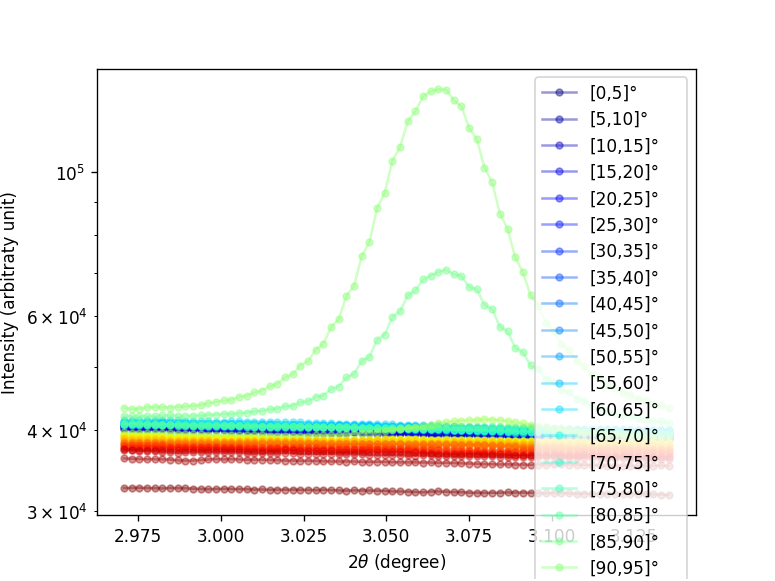

In [48]:
# Which image to plot:
jj =5
cmap = cm.get_cmap('jet', len(azimuth_toLoad))

fig = plt.figure()
for ii in range(0, azimuth_toLoad.shape[0]):
    plt.plot(Tth[0:I[:,ii,jj].shape[0]], I[:,ii,jj], marker="o", linestyle="-", alpha=0.4, markersize=4, color=cmap(ii), label=f"[{azimuth_toLoad[ii]},{azimuth_toLoad[ii]+delta_step}]°")
plt.yscale("log")
plt.xlabel(r"$2\theta$ (degree)")
plt.ylabel("Intensity (arbitraty unit)")
#plt.title(f"[111] Au peaks at F_NS = {LOG.strenghtNS[jj]} N | F_EW = {LOG.strenghtEW[jj]} N")
plt.legend()
fig.show()

-------

## Peak fitting (Batch processing)

Now, we want to fit all of those peaks (148 * 16 = 2368 peaks) !

The model should already be done, but as it was a bit long ago, lets redefine it to be sure of what we are doing.

In [102]:
# output = model.fit(input_y, parameters, x=input_x, \
#      fit_kws={"ftol":1e-22, "xtol":1e-10, "gtol":1e-22})

fitting peaks for the azimuthal range of [85, 90]


C:\Users\NayakS\AppData\Local\Temp\ipykernel_20444\1390874891.py:51: RuntimeWarning:

invalid value encountered in sqrt



<IPython.core.display.Javascript object>


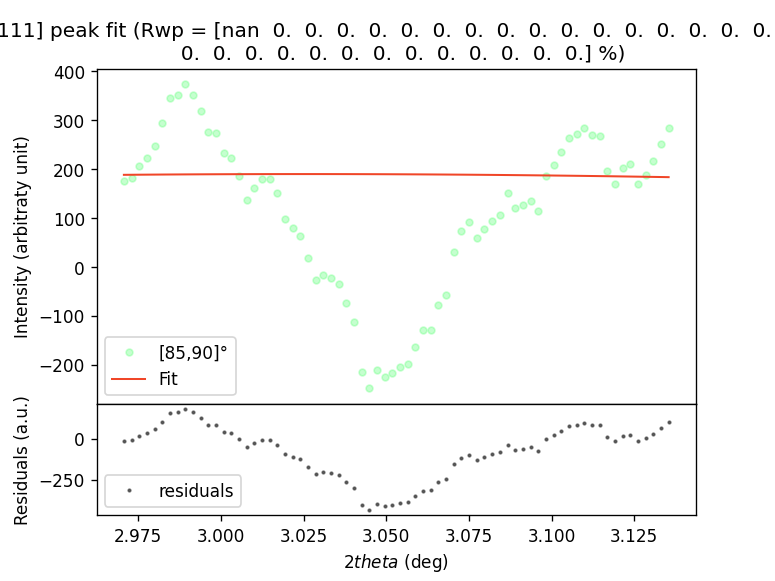

<IPython.core.display.Javascript object>


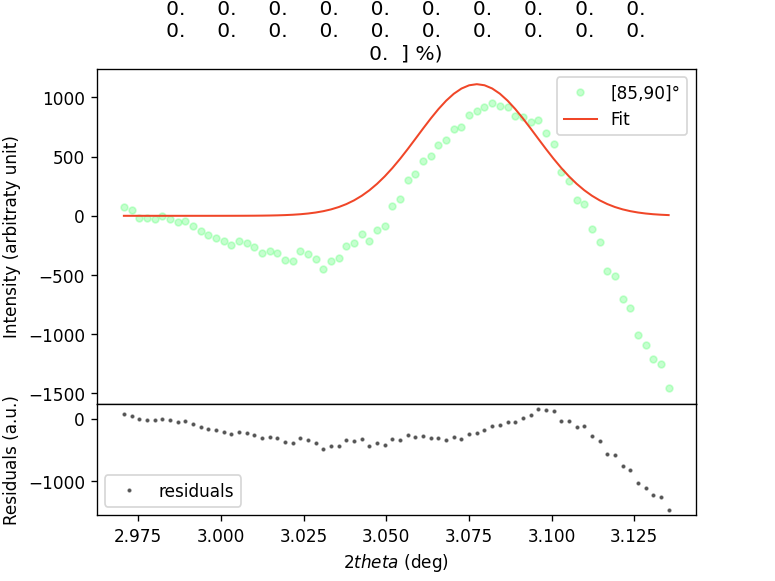

<IPython.core.display.Javascript object>


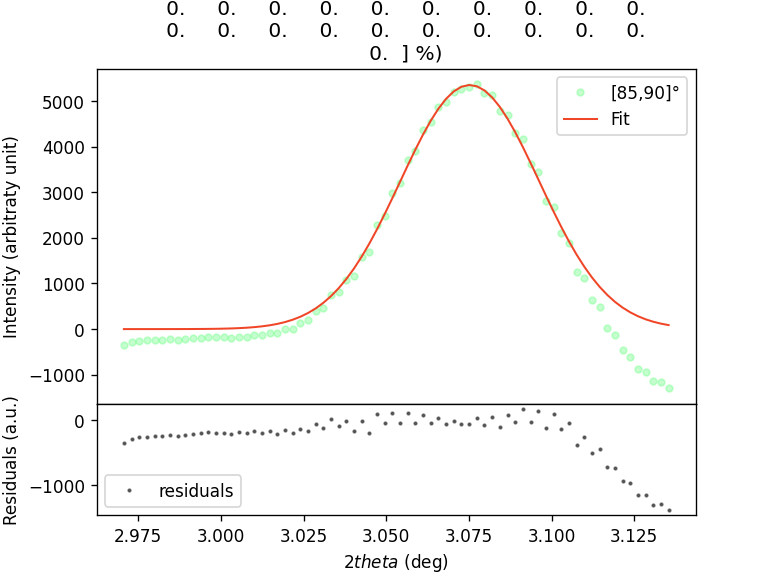

<IPython.core.display.Javascript object>


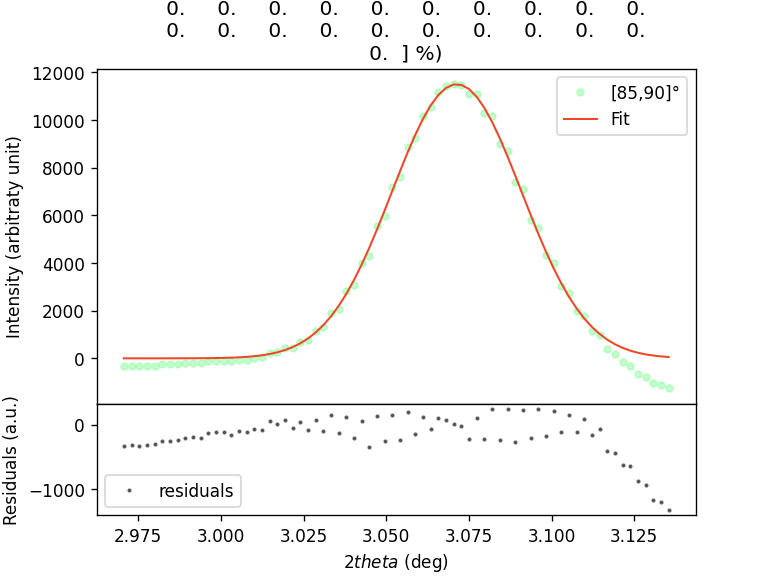

<IPython.core.display.Javascript object>


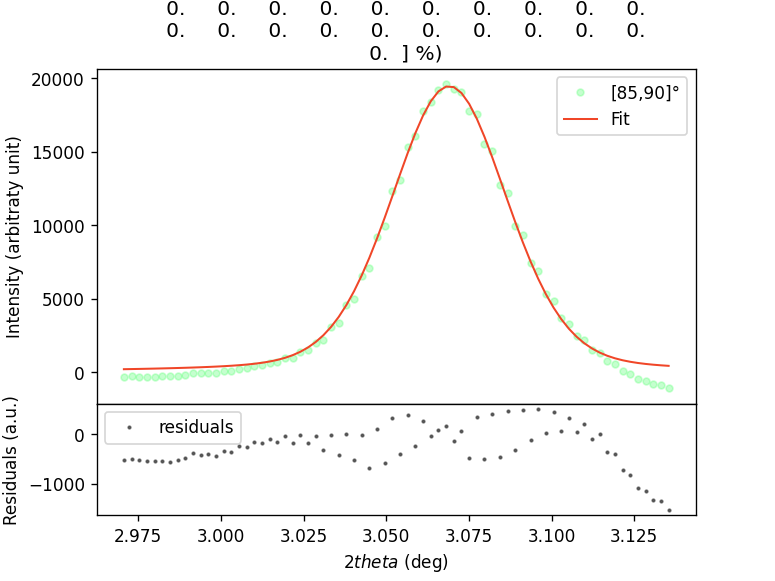

<IPython.core.display.Javascript object>


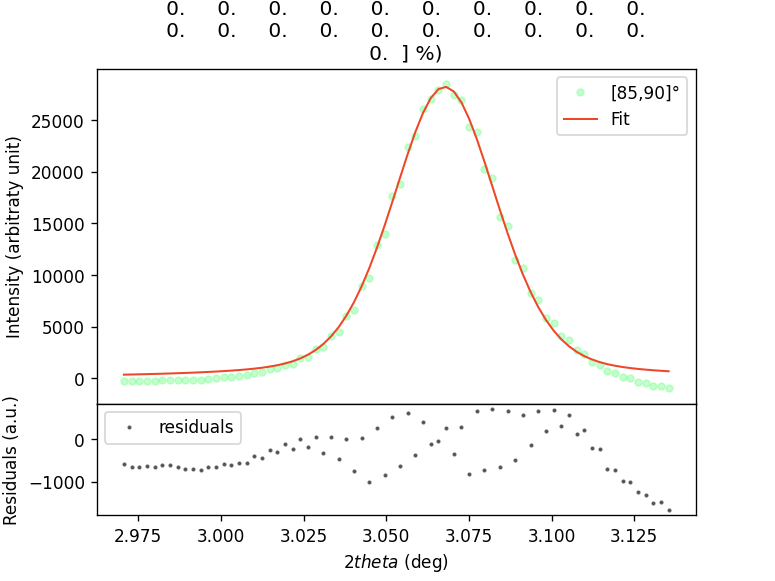

<IPython.core.display.Javascript object>


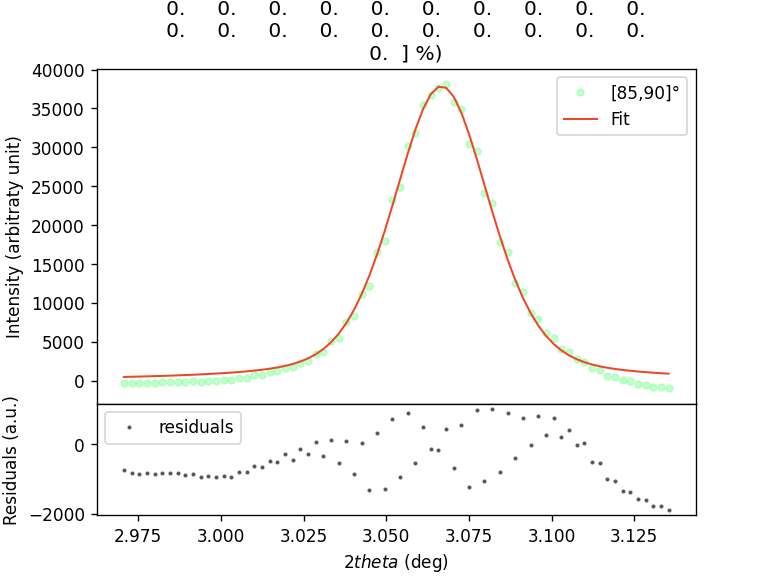

<IPython.core.display.Javascript object>


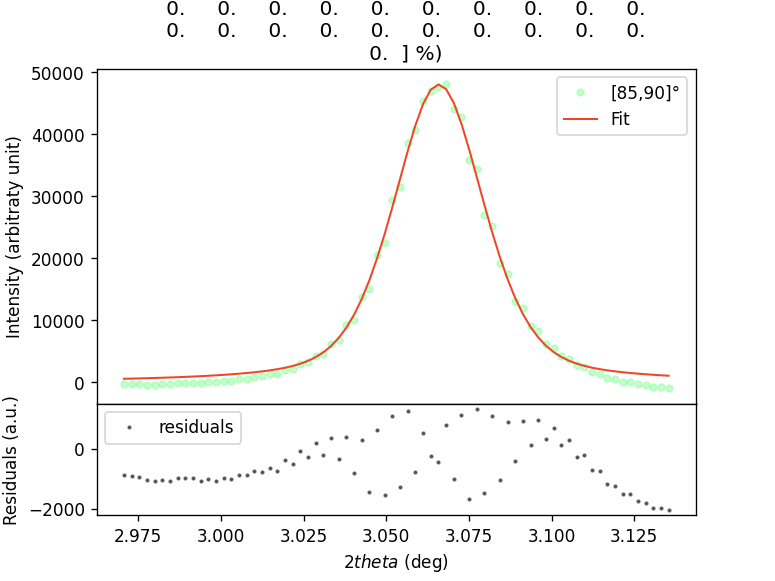

<IPython.core.display.Javascript object>


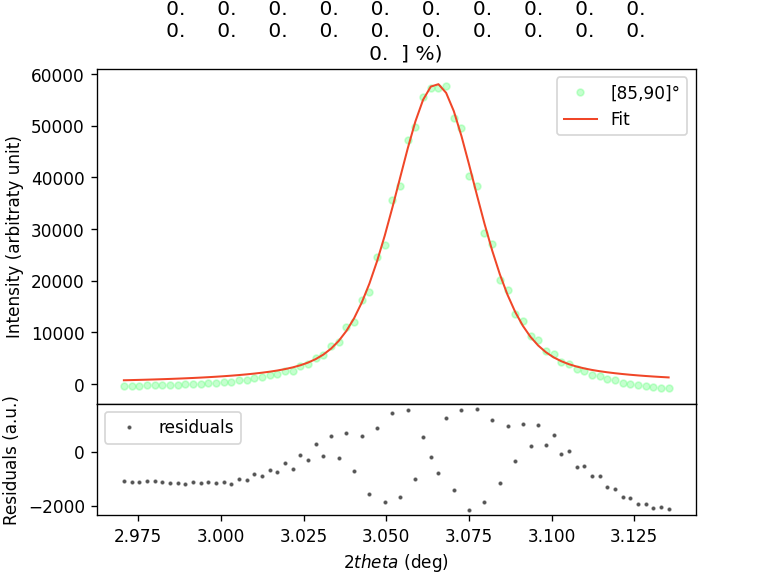

<IPython.core.display.Javascript object>


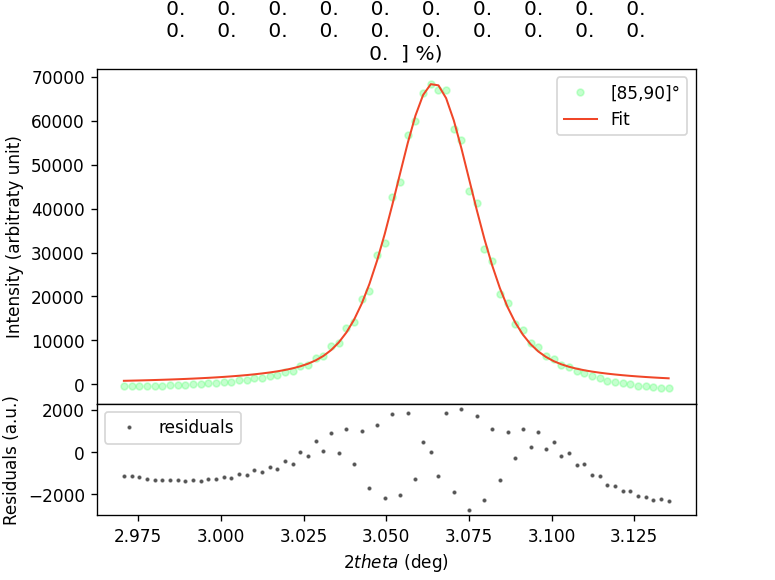

<IPython.core.display.Javascript object>


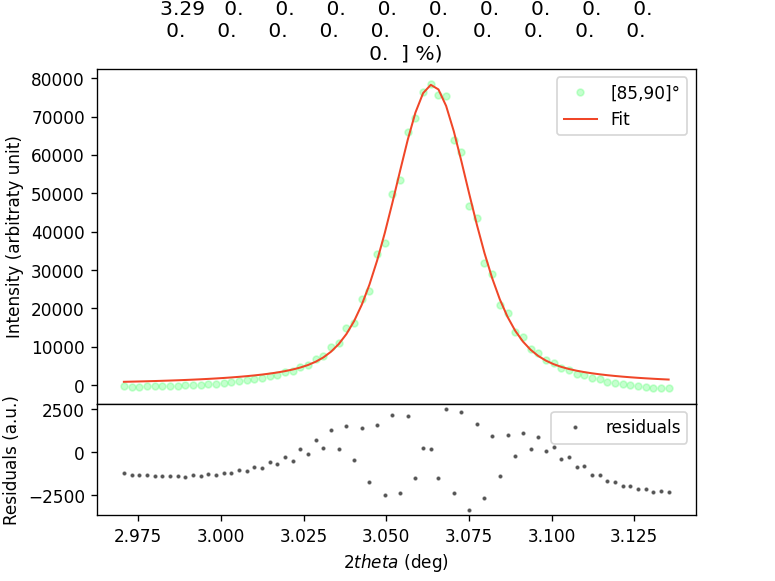

<IPython.core.display.Javascript object>


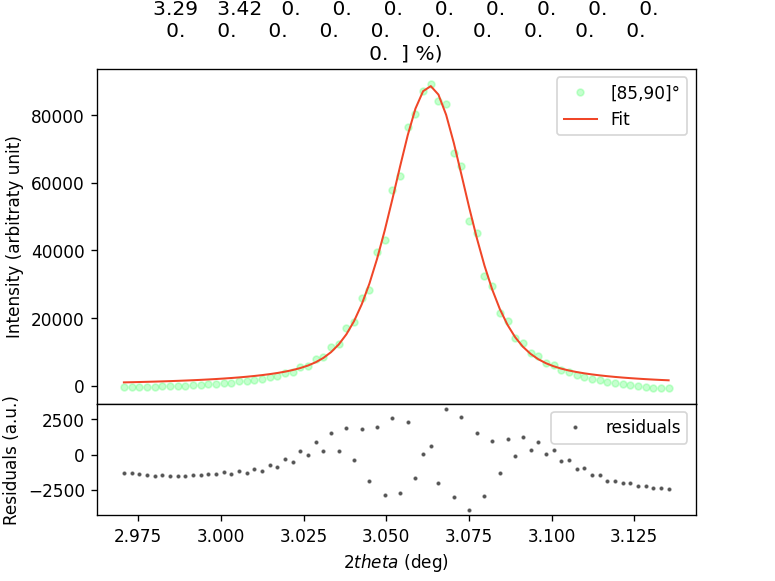

<IPython.core.display.Javascript object>


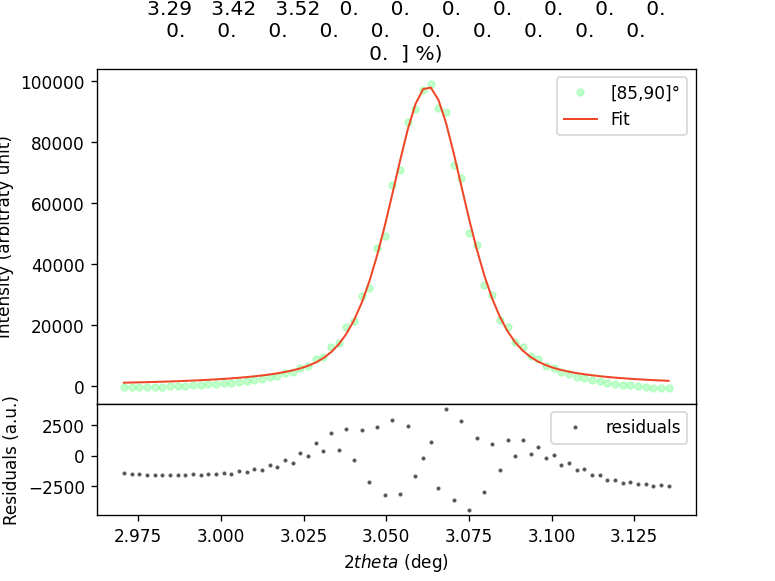

<IPython.core.display.Javascript object>


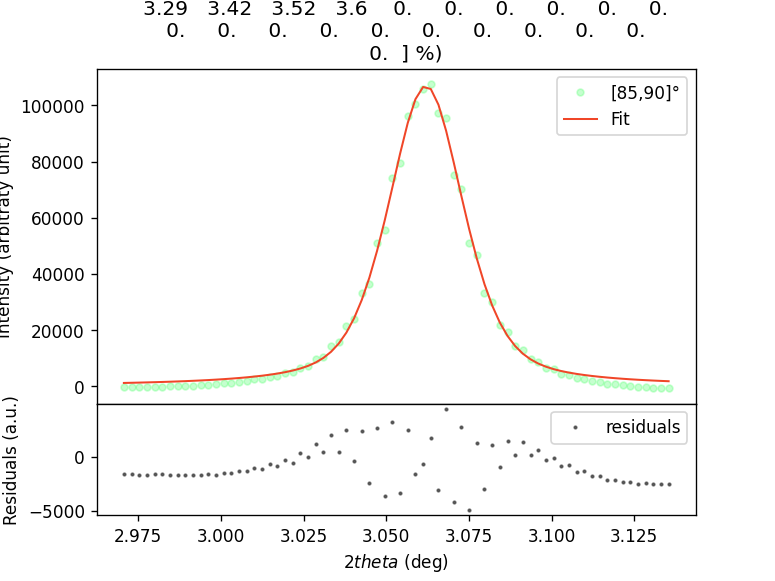

<IPython.core.display.Javascript object>


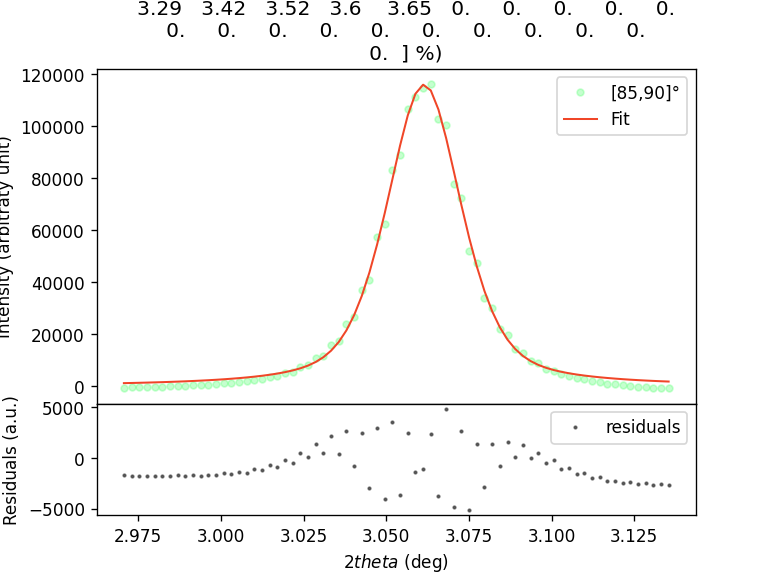

<IPython.core.display.Javascript object>


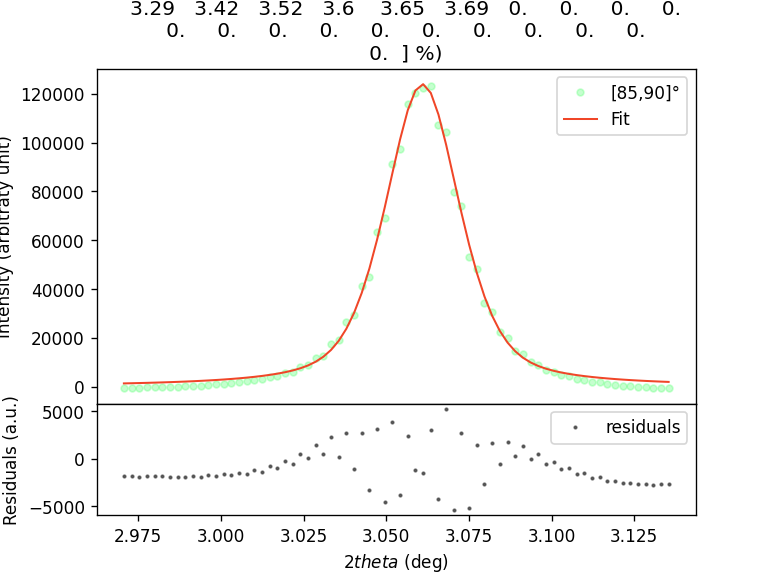

<IPython.core.display.Javascript object>


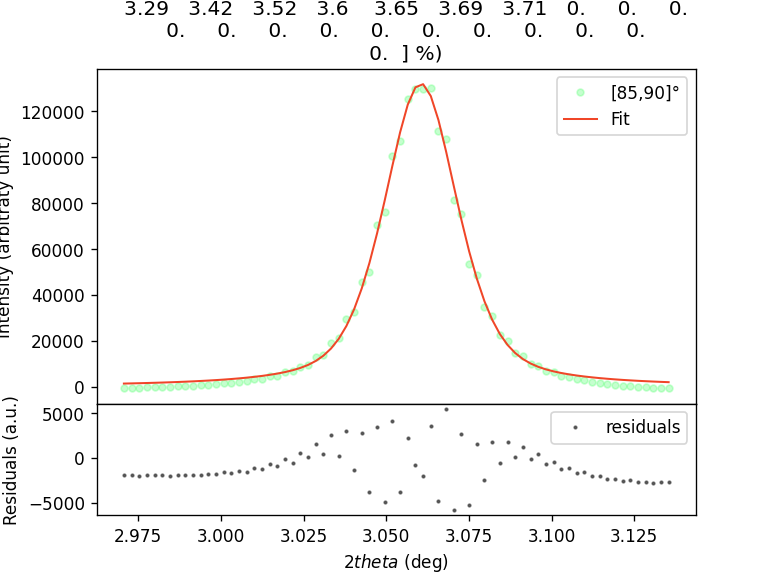

<IPython.core.display.Javascript object>


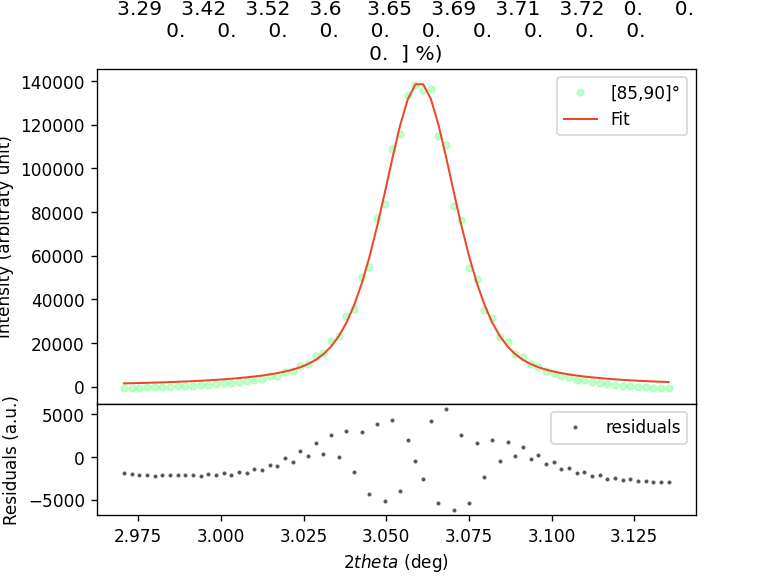

<IPython.core.display.Javascript object>


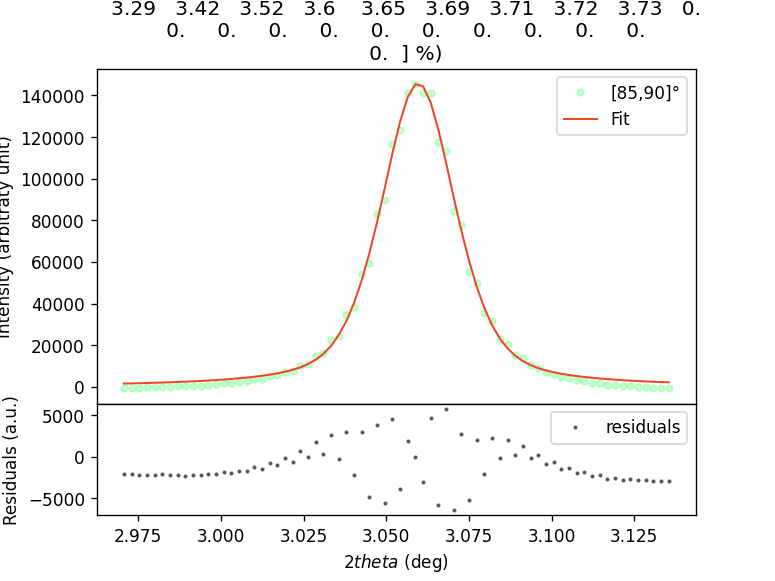

<IPython.core.display.Javascript object>


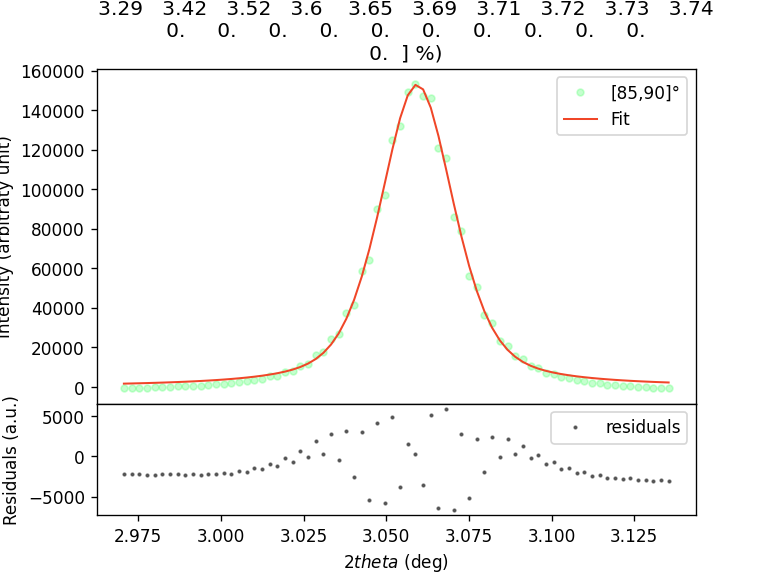

<IPython.core.display.Javascript object>


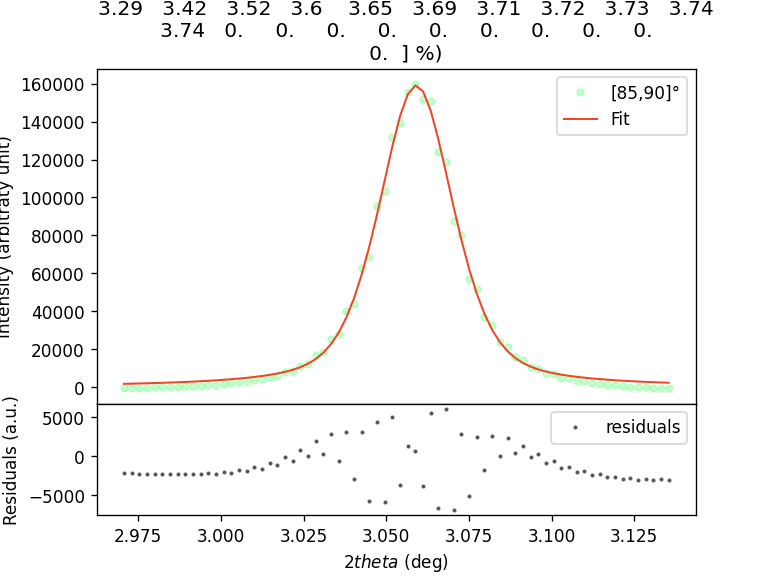

<IPython.core.display.Javascript object>


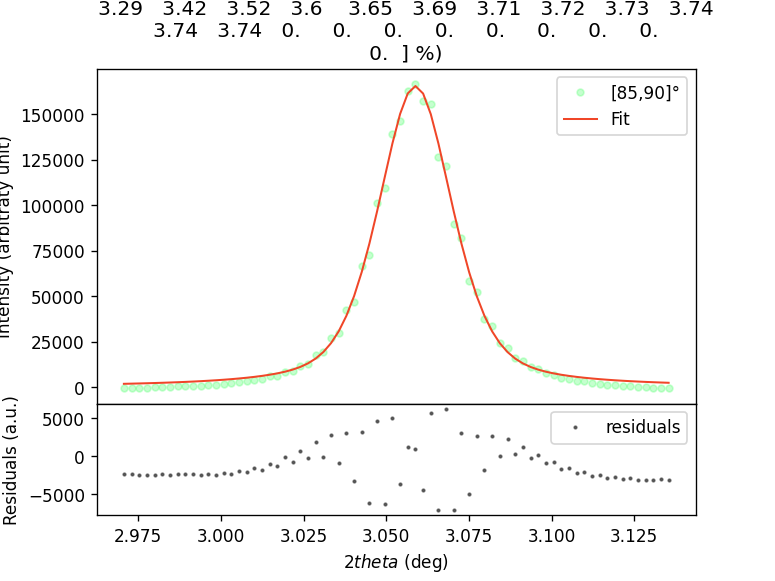

<IPython.core.display.Javascript object>


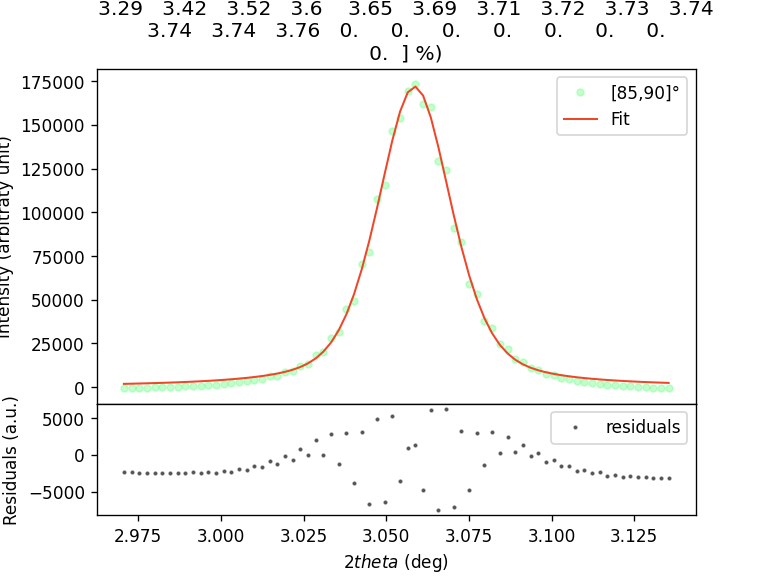

<IPython.core.display.Javascript object>


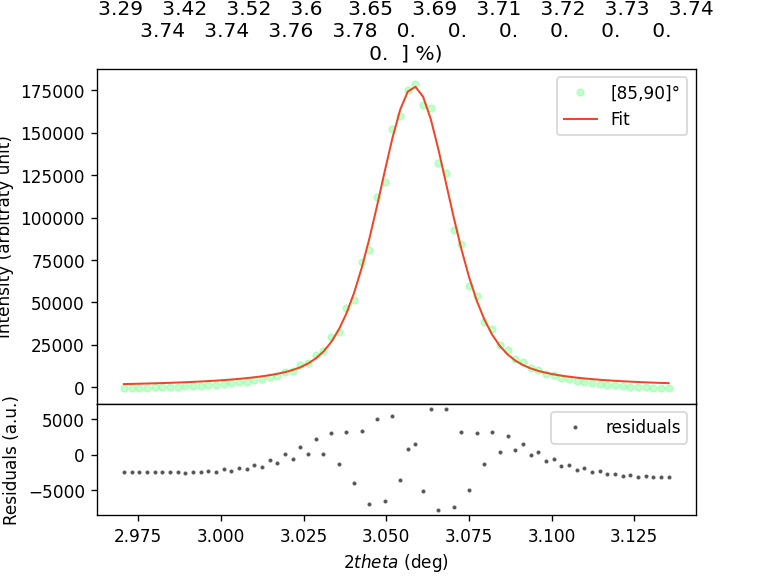

<IPython.core.display.Javascript object>


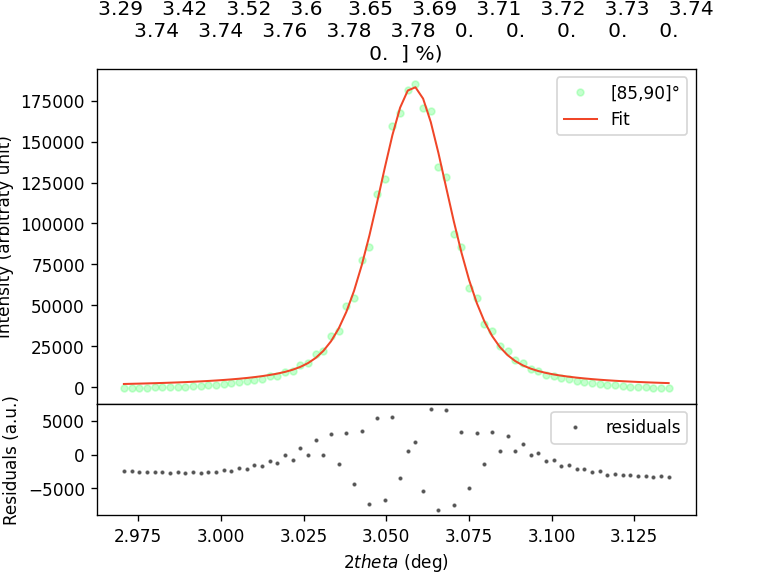

<IPython.core.display.Javascript object>


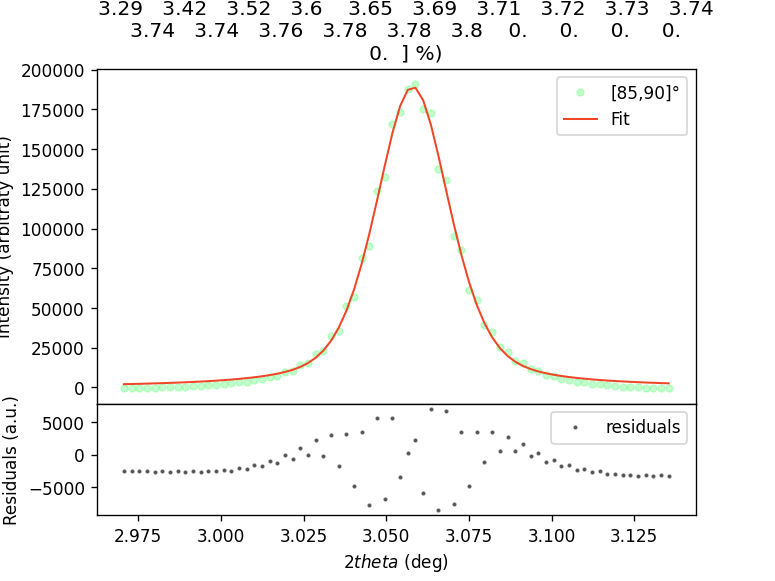

<IPython.core.display.Javascript object>


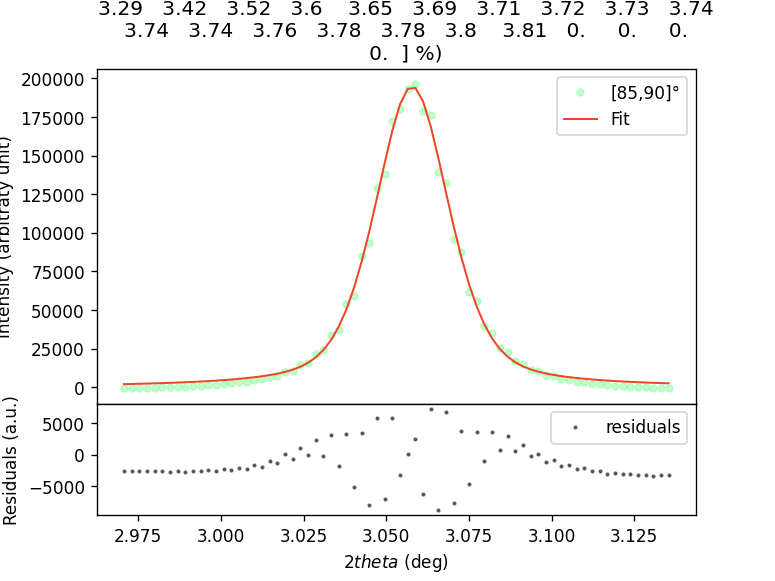

<IPython.core.display.Javascript object>


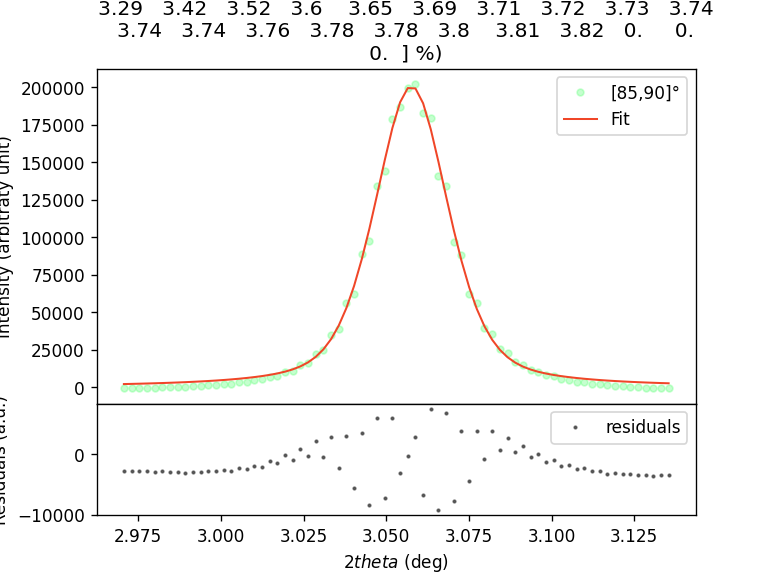

<IPython.core.display.Javascript object>


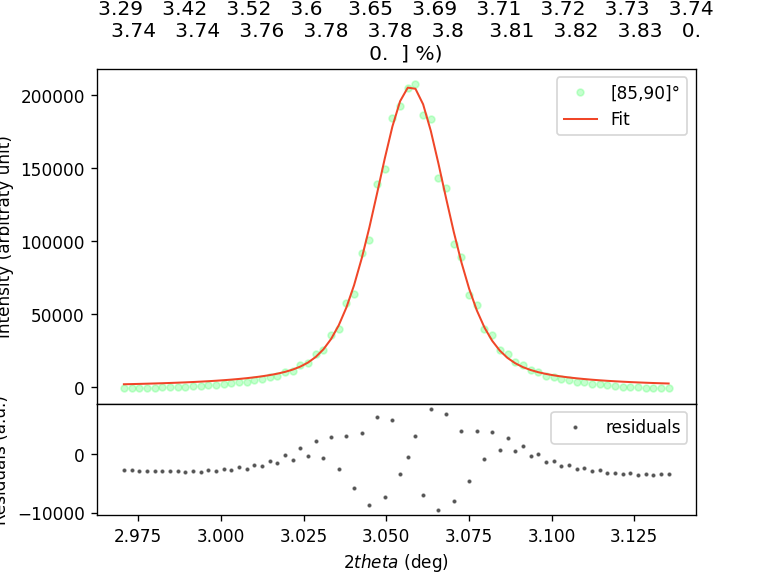

<IPython.core.display.Javascript object>


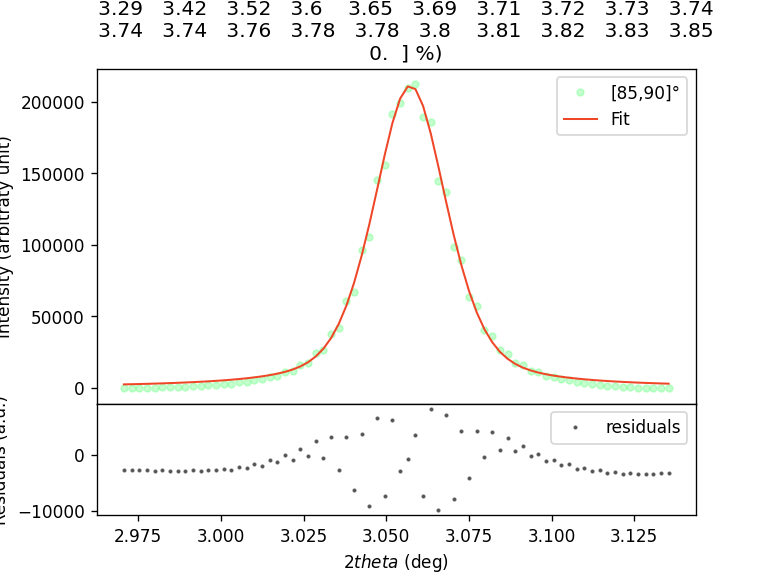

<IPython.core.display.Javascript object>


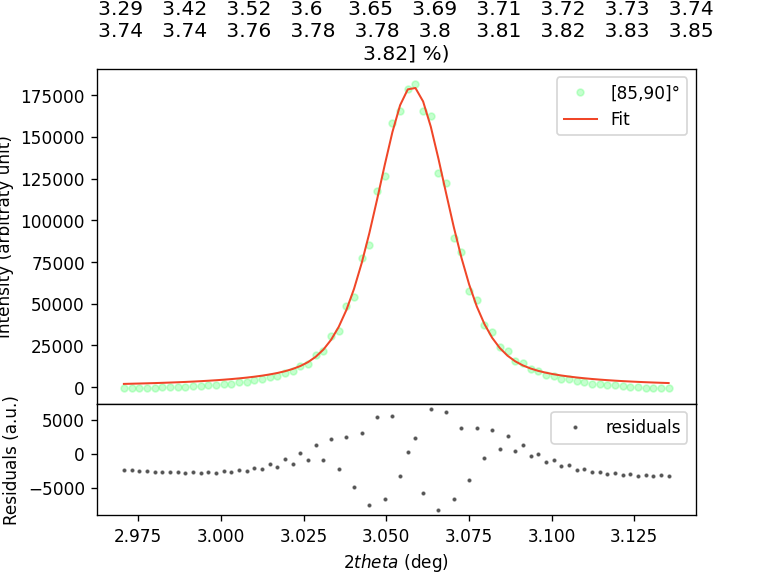

All done !


In [49]:
# Variable initialization: (it is getting more complicated, as the results are now 2D arrays...)
center = np.zeros((len(azimuth_toLoad), len(LOG.filename)))
center_err = np.zeros((len(azimuth_toLoad), len(LOG.filename)))
Amp    = np.zeros((len(azimuth_toLoad), len(LOG.filename)))
frac   = np.zeros((len(azimuth_toLoad), len(LOG.filename)))
Rwp    = np.zeros((len(azimuth_toLoad), len(LOG.filename)))
s      = np.zeros((len(azimuth_toLoad), len(LOG.filename)))
Int    = np.zeros((len(azimuth_toLoad), len(LOG.filename)))

#for ii in range(0, N_delta):
for ii in range(17, 18):
    print(f"fitting peaks for the azimuthal range of [{azimuth_toLoad[ii]}, {azimuth_toLoad[ii]+delta_step}]")
    for jj in range(0, len(LOG.filename)):
        xx=pd.DataFrame(I[:,ii,jj]) ## converting the intensity to array
        xx_1=pd.DataFrame(Tth)
        zz_1=pd.concat([xx_1,xx],axis=1)
        zz_1.columns=["two-theta","Int"]
        zz_1=zz_1[zz_1["Int"]> I_min]        
        #baseline_values=peakutils.baseline(I[:,ii,jj],deg=1,max_it=200,tol=1e-3)
        baseline_values=peakutils.baseline(zz_1["Int"],deg=1,max_it=500,tol=1e-3)
        yy = zz_1["Int"]-baseline_values       
        wgt = np.array(yy)
        if jj == 0:      
            pars = peak_model.make_params()
            pars['peak_amplitude'].set(value=1000, min=50, max=100000)
            pars['peak_center'].set(value=3.05,  min=3.025, max=3.125)
            pars['peak_fraction'].set(value=0.5, min=0.0, max=1) # (Some papers allow the fraction to be higher than 1)
            pars['peak_sigma'].set(value=0.02,    min=0.005, max=0.5) 
            Tth_new=zz_1["two-theta"]
            out = peak_model.fit(yy, pars, x=Tth_new, weights=wgt,nan_policy ="omit",fit_kws={"ftol":1e-50, "xtol":1e-50, 
                                                                                              "gtol":1e-50})
            I_fit = out.best_fit 
            
        else:
            pars = peak_model.make_params()
            pars['peak_amplitude'].set(value=1000, min=50, max=100000)
            pars['peak_center'].set(value=3.1,  min=3.0, max=3.150)
            pars['peak_fraction'].set(value=0.5, min=0.0, max=1) # (Some papers allow the fraction to be higher than 1)
            pars['peak_sigma'].set(value=0.02,    min=0.01, max=0.5) 
            Tth_new=zz_1["two-theta"]
            out = peak_model.fit(yy, pars, x=Tth_new, weights=wgt,nan_policy ="omit",
                                 fit_kws={"ftol":1e-50, "xtol":1e-50, "gtol":1e-50})
            I_fit = out.best_fit
            
        center[ii,jj] = out.best_values["peak_center"]
        center_err[ii,jj] = out.params.get('peak_center').stderr
        Amp[ii,jj]    = out.best_values["peak_amplitude"]
        frac[ii,jj]   = out.best_values["peak_fraction"]
        s[ii,jj]      = out.best_values["peak_sigma"]
        Int[ii,jj]       = out.params.get('peak_height').value
        Rwp[ii,jj]    = (np.sqrt(np.sum(wgt*(yy-out.best_fit)**2) / np.sum(wgt*yy**2))) * 100;
        #else:
        #    pass

        fig = plt.figure()
        grid = fig.add_gridspec(4, 1, hspace=0)

        ax1 = plt.subplot(grid[0:3, 0])
        plt.plot(Tth_new, yy, marker="o", linestyle="none", alpha=0.4, markersize=4,\
        color=cmap(ii), label=f"[{azimuth_toLoad[ii]},{azimuth_toLoad[ii]+delta_step}]°")
        plt.plot(Tth_new, I_fit, '-', color = [240/255, 70/255, 40/255], linewidth=1.2, label = "Fit")
 
        plt.yscale("linear")
        plt.xlabel(r"$2\theta$ (degree)")
        plt.ylabel("Intensity (arbitraty unit)")
        plt.title(f"[111] peak fit (Rwp = {np.round(Rwp[ii]*100)/100} %)")
        plt.legend()

        ax2 = plt.subplot(grid[3, 0], sharex=ax1)
        plt.plot(Tth_new, yy - out.best_fit, 'o', markersize = 1.5, alpha = 0.6,\
         color = [30/255, 30/255, 30/255], label = "residuals")
        plt.legend(loc='best')
        plt.xlabel(r"$2 theta$ (deg)")
        plt.ylabel("Residuals (a.u.)")
    
        fig.canvas.draw()
        fig.canvas.flush_events()
    
print("All done !")

In [156]:
pd.set_option('display.max_columns', None)
pd.DataFrame(center[0]).iloc[0]
#.isnull().values.any()

0    3.617394
Name: 0, dtype: float64

<IPython.core.display.Javascript object>


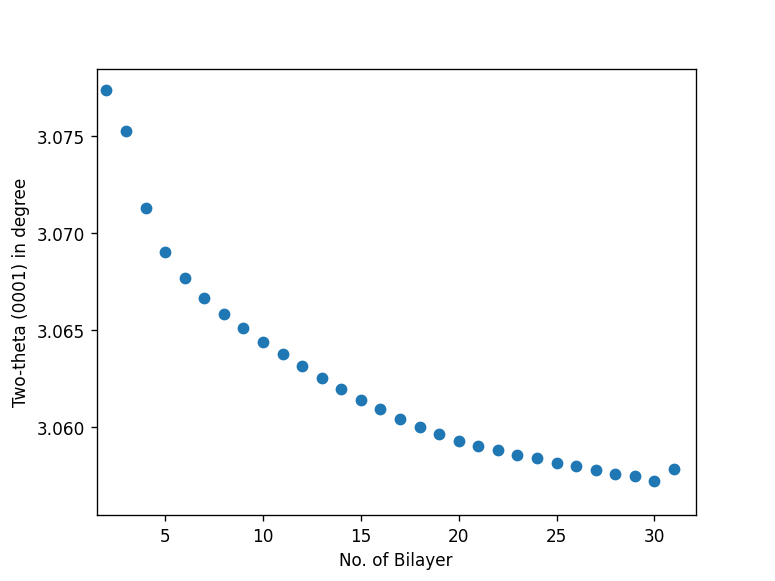

In [55]:
pd.DataFrame(center[0]).iloc[17]=None
pd.DataFrame(center[1]).iloc[17]=3.0850

pd.DataFrame(s[0]).iloc[17]=None

fig = plt.figure()
plt.scatter(np.linspace(1,len(center[17]),len(center[17])),center[17])
plt.xlabel("No. of Bilayer")
plt.ylabel("Two-theta (0001) in degree")
#center[0]
fig.show()

In [56]:
#Tth = res.radial # deg
d_hkl=get_wavelenght(73.8)/(2*np.sin((center[17]*np.pi/180)/2))
d_hkl*(10**9) #in nm


array([0.31826716, 0.31285057, 0.31306964, 0.31346978, 0.31370375,
       0.31383892, 0.31394256, 0.31402876, 0.31410278, 0.31417697,
       0.31423878, 0.31430411, 0.31436672, 0.31442491, 0.31448397,
       0.31453097, 0.31458162, 0.31462753, 0.31466373, 0.31470122,
       0.31472608, 0.31475062, 0.31477686, 0.31479254, 0.31481663,
       0.31483443, 0.31485406, 0.31487482, 0.31488647, 0.31491087,
       0.3148477 ])

<IPython.core.display.Javascript object>


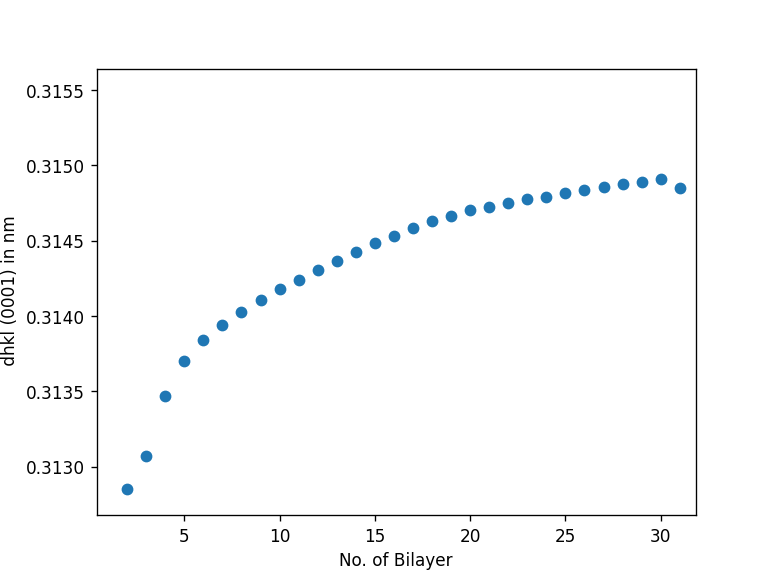

In [61]:

fig = plt.figure()
plt.scatter(np.linspace(1,len(center[17]),len(center[17])),d_hkl*(10**9))
plt.xlabel("No. of Bilayer")
plt.ylabel(" dhkl (0001) in nm")
#center[0]
fig.show()


In [58]:
np.linspace(1,len(center[0]),len(center[0]))

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25., 26.,
       27., 28., 29., 30., 31.])

In [59]:
final_results=pd.DataFrame({
    "bilayer":np.linspace(1,len(center[17]),len(center[17])),
    "twotheta": center[17],
    "fwhm": s[17]*2})

#final_results.to_csv("PS22014second_0001.csv")

<IPython.core.display.Javascript object>


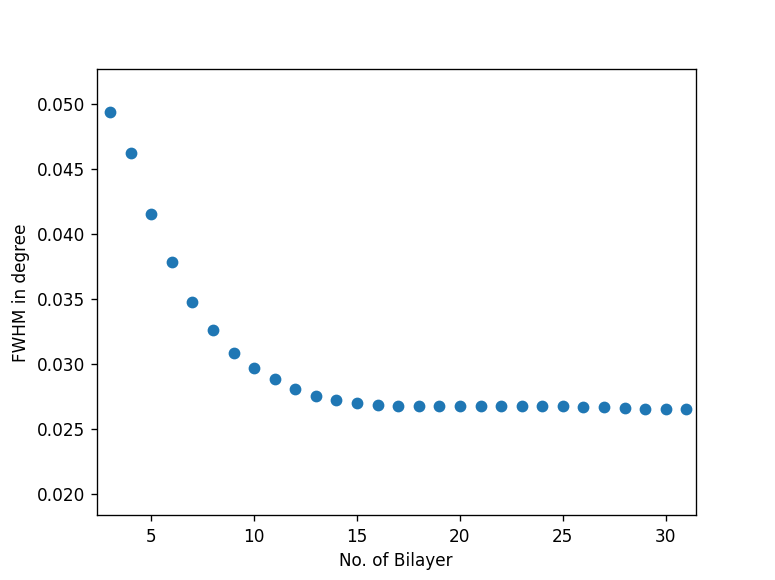

In [60]:
fig = plt.figure()
plt.scatter(final_results["bilayer"],final_results["fwhm"])
plt.xlabel("No. of Bilayer")
plt.ylabel("FWHM in degree")
fig.show()